In [1]:
import pandas as pd
import xarray as xr
import numpy as np
from linopy import Model
import matplotlib.pyplot as plt

# Base case : Energy Mix

### Define the curve of the Saint Laurent flux

In [2]:
def hydro_data_creation():
    """
    Nous possédons les données journalières du fleuve de Saint Laurent à Montréal.
    Les données sont : le débit Minimum, Maximum, et Médian.
    Sur base de ce débit, nous estimons un débit horaire suivant deux marées hautes par jour.
    """
    # 1. Lecture et parsing de la colonne DateTime
    debit = pd.read_csv('Data/dbit-la-station.csv')
    
    # Nettoyage de la colonne et parsing
    debit['DateTime'] = pd.to_datetime(
        debit['DateTime'].str.strip().str.replace(r'\s+', ' ', regex=True),
        format='%m/%d %H:%M:%S',  # Change to '%d/%m %H:%M:%S' if needed
        errors='raise'
    )
    
    # 2. Forcer l'année 2025
    debit['DateTime'] = debit['DateTime'].apply(lambda dt: dt.replace(year=2025))
    
    # 3. Créer le DataFrame journalier
    debit['Date'] = debit['DateTime'].dt.date
    debit_daily = debit.set_index('Date')[['Minimum', 'Médiane', 'Maximum']]
    debit_daily = debit_daily[~debit_daily.index.duplicated(keep='first')]  # Enlever les doublons

    # 4. Générer l'index horaire sur 8760 pas (année non bissextile)
    hours = pd.date_range(start='2025-01-01 01:00:00', periods=8760, freq='h')

    # 5. Construire le DataFrame horaire et joindre les valeurs journalières
    df = pd.DataFrame(index=hours)
    df['Date'] = df.index.date
    df = df.join(debit_daily, on='Date')

    # 6. Calcul de l’amplitude et du Flow_pred par sinusoïde (marée semi-diurne)
    omega = 2 * np.pi / 12.42
    t = np.arange(len(df))
    
    df['Amplitude'] = (df['Maximum'] - df['Minimum']) / 2
    df['Flow_pred'] = df['Médiane'] + df['Amplitude'] * np.sin(omega * t)

    # 7. Nettoyage des colonnes auxiliaires
    df.drop(columns=['Date', 'Minimum', 'Maximum', 'Médiane', 'Amplitude'], inplace=True)

    # 8. Sauvegarde dans le dossier data
    df.to_csv('Data/dbit-hourly-pred-fullindex.csv')
    
    return df

In [3]:
"""
Sur base de ce débit, nous pouvons évaluer la puissance de la power plant.
sur base de l'equation P = g * Q * H * eff
g = gravité, Q = débit, H = hauteur de tête, eff = rendement ( 50 % pour petite hydropower plant)
le fleuve fait en moyenne 2000 metres de large ( la partie la plus proche de l'université)
nous abordons une  centrale du type "run-of-river", déviant donc une partie du débit pour la convertir en energie.
Nous considérons que 20 metres de large sont dévié sur les 2000 m, représentant 1 % du debit du barrage.
Le débit oscille donc entre 60 et 100 m³/s. H n'est supposée qu' a 2-3 mètre puisque les données topologique de Montreal n'indique que ce genre de faible difference de hauteur entre différents points de la rivière.
Ceci nous ammène donc à un potentiel entre 900 et 1500 KW. De plus, certaines années peuvent être caractérisée par des flux plus faibles ou plus fort.
Ces différents flux seront abordés dans la partie uncertainties.

Nous n'autoriserons qu'une capacité maximale de 1 MW pour notre centralle électrique.
Cette limite peremt de ne pas dénaturé le Fleuve Saint Laurent, grand fleuve iconique de Montréal.
Cette limite peut être vue comme une norme/autorisation/restriction gouvernemental.
Dés lors, la puissance réel varie entre 1000 kWh et 600 kWh selon le débit. 
Le débit peut donc être vu comme un availibility factor (AF) puisque les prix avantageux des centrales
hydroélectriques poussent l'optimiseurs à les choisir
"""
def debit_to_AF(debit):
    g = 10
    H = 2
    eff = 0.5
    power = debit * H * g * eff
    AF = power / 1000
    return AF



### Loading the data

In [4]:
### Loading the data and convert to xarray DataSet

# Technologies data:
tech_param = pd.read_csv('Data/technologies.csv',index_col=0)

# Storages data
sto_param = pd.read_csv("Data/storage_technologies.csv", index_col=0).to_xarray()

# Demand:
demand =pd.read_csv('Data/demand_h_c.csv',index_col=0).to_xarray() * 1e-3 #en MWh#pd.read_csv('Data/demand_hourly.csv',index_col=0).to_xarray() * 1e-3 #en MWh

# Renewable generation:
AF = pd.read_csv('Data/AF.csv',index_col=0) # AF is given in the file only for the renewables, we need to add columns for the other technologies.
AF['Wind'] = AF['Wind'].where(AF['Wind'] > 0.01, 0)
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
AF['Hydro'] = AF_hydro.values
AF['Hydro'] = AF['Hydro'].where(AF['Hydro'] < 1, 1)
for tech in tech_param.index:
    if tech not in AF.columns:
        AF.loc[:,tech] = tech_param.loc[tech, "Availability"] 
tech_param = tech_param.to_xarray()

# Global parameters:
general_parameters = pd.read_csv('Data/global_parameters.csv',index_col=0)

In [5]:
AF

,PV,Wind,Hydro,Biomass
Date/Time,,,,
01/01 01:00:00,0.0,0.862,0.808000,1
01/01 02:00:00,0.0,0.788,0.920909,1
01/01 03:00:00,0.0,0.484,1.000000,1
01/01 04:00:00,0.0,0.060,1.000000,1
01/01 05:00:00,0.0,0.026,1.000000,1
...,...,...,...,...
12/31 20:00:00,0.0,0.474,0.682570,1
12/31 21:00:00,0.0,0.343,0.791471,1
12/31 22:00:00,0.0,0.578,0.903260,1


### Create the Sets and PARAMETERS of the linopy model

In [6]:
### Sets
Time = demand.get_index("Time")
Tech = tech_param.get_index("Technologies")
Sto = sto_param.get_index("Storages")

# Technologies related
TECH_MAX_CAP = tech_param['Maximum capacity']
MARGINAL_FUEL_COST = tech_param['Fuel costs']/tech_param['Rated efficiency']
CO2_INTENSITY = tech_param['Fuel CO2 content']/tech_param['Rated efficiency']
TECH_PHI = tech_param["Discount rate"]/(1-(1+tech_param["Discount rate"])**(-tech_param["Lifetime"]))
TECH_IC = TECH_PHI*tech_param['Investment cost']
DELTA_MAX_UP = tech_param['Ramp-up rate']
DELTA_MAX_DOWN = tech_param['Ramp-down rate']
AF = AF[Tech]
AF  = xr.DataArray(AF,coords=[Time,Tech])
LEGACY = tech_param["Legacy capacity"]


# Storage related
STO_MAX_CAP = sto_param["Maximum capacity"]
STO_PHI = sto_param["Discount rate"]/(1-(1+sto_param["Discount rate"])**(-sto_param["Lifetime"]))
STO_IC = STO_PHI*sto_param["Investment cost"]
EFF_D = sto_param["Discharge efficiency"]
EFF_C = sto_param["Charge efficiency"]
SOC_MAX = sto_param["Maximum state of charge"]
SOC_MIN = sto_param["Minimum state of charge"]
STO_dT = sto_param["Storage duration"]


# Configuration and scenario parameters
DEMAND = demand["Demand"]
TS = float(general_parameters.Value.loc['Time step'])
VOLL = float(general_parameters.Value.loc['VOLL'])
CO2_PRICE = float(general_parameters.Value.loc['CO2_price'])
CO2_BOUND = 68744363 * 0.5 # float(general_parameters.Value.loc['CO2_bound']) 

### Write the optimization model (variables, constraints and objective function)

In [7]:
### Create the model instance

m = Model()

### Create the variables

cap_tech = m.add_variables(lower = 0, coords = [Tech], name = 'cap_tech') # Installed capacity of the technologies [MW]
g = m.add_variables(lower = 0, coords = [Tech, Time], name = 'g')        # Generated power [MW]
fcd = m.add_variables(lower = 0, coords = [Tech, Time], name = 'fcd')    # Fuel cost definition [EUR/h]

cap_sto = m.add_variables(lower = 0, coords = [Sto], name = 'cap_sto') # Installed capacity of the storages [MW]
sd = m.add_variables(lower = 0, coords = [Sto, Time], name = 'sd')     # Storage discharge [MW]
sc = m.add_variables(lower = 0, coords = [Sto, Time], name = 'sc')     # Storage charge [MW]
se = m.add_variables(lower = 0, coords = [Sto, Time], name = 'se')     # Stored energy [MWh]

co2_emissions =  m.add_variables(lower = 0, name = 'co2_emissions')     # Combined CO2 emissions [tCO2eq]
ens = m.add_variables(lower = 0, coords = [Time], name = 'ens')           # Energy not served [MWh]

curt = m.add_variables(lower = 0, coords = [Time])                      # Curtailment [MWh]

# Create the constraints

# Technology sizing
cap_max_tech = m.add_constraints( cap_tech <= TECH_MAX_CAP, name = 'cap_max_tech') # Installed capasity of the tech [MW]
power_max = m.add_constraints( g<= AF * cap_tech, name = 'power_max_tech') # maximum generated power

# Ramping up/down constraints
power_rampup_initial = m.add_constraints(g.loc[:,:Time[0]] - g.loc[:,Time[len(Time)-1]:] <= DELTA_MAX_UP*cap_tech , name = 'power_rampup_initial')
power_rampup = m.add_constraints(g.loc[:, Time[1:]] <= g.shift(Time = 1) + DELTA_MAX_UP*cap_tech, name = 'power_rampup')

power_rampdown_initial = m.add_constraints(g.loc[:,:Time[0]] - g.loc[:,Time[len(Time)-1]:]  >= - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown_initial')
power_rampdown = m.add_constraints(g.loc[:, Time[1:]]>= g.shift(Time = 1) - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown')


# Storage sizing + Initial condition
cap_max_sto = m.add_constraints( cap_sto <= STO_MAX_CAP, name = 'cap_max_sto') #max storage depending on the country
storage_initial_state = m.add_constraints(se.loc[:,:Time[0]] - se.loc[:,Time[len(Time)-1]:]  == TS*EFF_C*sc.loc[:,Time[len(Time)-1]:] - TS*sd.loc[:,Time[len(Time)-1]:]/EFF_D, name = 'storage_initial_state')
storage_balance = m.add_constraints(se.loc[:,Time[1:]] - se.shift(Time = 1) == TS*EFF_C*sc.loc[:,Time[1:]] -TS*sd.loc[:,Time[1:]]/EFF_D, name = 'storage_balance')
storage_charge_max = m.add_constraints( sc <= cap_sto/STO_dT, name = 'storage_charge_max') 
storage_discharge_max = m.add_constraints( sd <= cap_sto/STO_dT, name = 'storage_discharge_max') 
storage_energy_max = m.add_constraints( se <= cap_sto * SOC_MAX , name = 'storage_energy_max')
storage_energy_min = m.add_constraints( se >= cap_sto * SOC_MIN , name = 'storage_energy_min')

# Market clearing
mcc = m.add_constraints( g.sum(dims = 'Technologies') + (sd - sc).sum(dims = 'Storages') + ens == DEMAND, name = 'mcc') # demand = generation + discharge - charge + energy_not_served(ens)

# Limit on energy not served
ens_lim = m.add_constraints(ens<=DEMAND, name = 'ens_lim')

# Costs
fuel_cost = m.add_constraints(fcd == MARGINAL_FUEL_COST*g, name="fuel_cost")

# CO2 Emissions
co2_account = m.add_constraints(co2_emissions == (CO2_INTENSITY * g).sum(dims = ['Technologies', 'Time']), name = 'co2_account') #co2 intensity 
co2_bound = m.add_constraints(co2_emissions <= CO2_BOUND, name = 'co2_bound')

### Curtailment evaluation.
RE_MASK = xr.DataArray(np.array([1,1,1,0]), coords = [Tech])
curt_const = m.add_constraints(curt == ((AF*cap_tech-g)*RE_MASK).sum(dims = 'Technologies') , name = 'curt')

# Add the objective function
total_cost = (TECH_IC*cap_tech).sum(dims='Technologies') + (STO_IC*cap_sto).sum(dims='Storages') + (TS*fcd).sum(dims=['Technologies', 'Time']) + (VOLL*TS*ens).sum(dims = 'Time')
m.add_objective(total_cost)

### Solve

In [9]:
#m.solve("gurobi")
m.solve("highs")

Writing continuous variables.: 100%|██████████| 10/10 [00:00<00:00, 70.12it/s]


Running HiGHS 1.10.0 (git hash: fd86653): Copyright (c) 2025 HiGHS under MIT licence terms
LP   linopy-problem-scxmg_hu has 210255 rows; 113886 cols; 559183 nonzeros
Coefficient ranges:
  Matrix [1e-03, 4e+01]
  Cost   [1e+00, 6e+05]
  Bound  [0e+00, 0e+00]
  RHS    [7e-01, 3e+07]
Presolving model
151093 rows, 73730 cols, 459547 nonzeros  0s
Dependent equations search running on 21126 equations with time limit of 1000.00s
Dependent equations search removed 0 rows and 0 nonzeros in 0.01s (limit = 1000.00s)
145932 rows, 68575 cols, 474323 nonzeros  0s
Presolve : Reductions: rows 145932(-64323); columns 68575(-45311); elements 474323(-84860)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Pr: 8760(8465.63) 0s
       8784     1.1142597284e+06 Pr: 23950(283915); Du: 0(8.95725e-09) 6s
      15241     1.1379488823e+06 Pr: 17684(210425); Du: 0(1.12257e-07) 12s
      22833     1.2419689050

('ok', 'optimal')

## Post-process

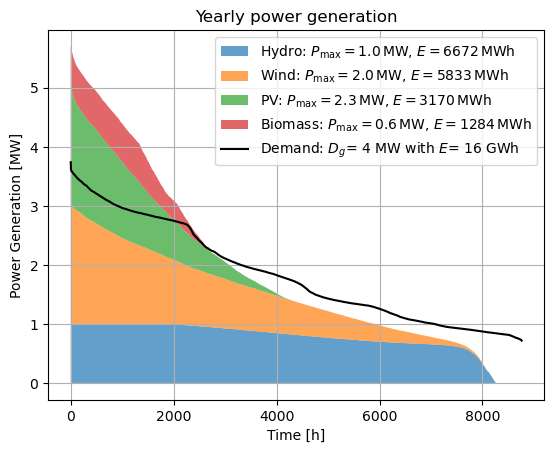

In [10]:


storage_discharge_df = sd.solution.to_dataframe().unstack(level=0)
storage_discharge_df.columns = storage_discharge_df.columns.droplevel(0)
storage_charge_df = sc.solution.to_dataframe().unstack(level=0)
storage_charge_df.columns = storage_charge_df.columns.droplevel(0)

Demand_ld = pd.DataFrame(index=Time)
Demand_ld['Demand'] =  demand["Demand"]
Demand_ld['interval'] = 1
Demand_ld = Demand_ld.sort_values(by=['Demand'], ascending = False)
Demand_ld['duration'] = Demand_ld['interval'].cumsum()

generation_df = g.solution.to_dataframe().unstack(level=0)
generation_df.columns = generation_df.columns.droplevel(0)
total_production = generation_df.sum()
sorted_columns = total_production.sort_values(ascending=False).index

generation_df = generation_df[sorted_columns].apply(lambda x: x.sort_values(ascending=False).values, axis=0)

bottom_stack = np.zeros(8760)

for column in generation_df.columns:
    plt.fill_between(range(8760), bottom_stack, bottom_stack + generation_df[column], label = (r'%s: $P_\mathrm{max}=%.1f\,\mathrm{MW}$, 'r'$E=%.0f\,\mathrm{MWh}$') % (column, cap_tech.solution.loc[column], g.solution.loc[column].sum()), alpha=0.7)
    bottom_stack += generation_df[column]
plt.plot()
plt.plot(Demand_ld['duration'], Demand_ld['Demand'], 'k-', label=r'Demand: $D_g$= %.0f MW with $E$= %.0f GWh' %(demand["Demand"].max(), demand["Demand"].sum()*1e-3))
plt.xlabel("Time [h]")
plt.ylabel("Power Generation [MW]")
plt.title("Yearly power generation")
plt.legend()
plt.grid()
plt.savefig("./plot/energymix.pdf", transparent=True, dpi=300, bbox_inches='tight')
plt.show()

The curve of Wind production is not accurate. In the Course of Renewable energy of the first quadrimester, we saw that a wind turbine has a curve of power that determines it's availibility factor for a given wind speed. After looking at this curve and at the vaue of AF given by renewable ninja for each wind speed, I have to conclude that it do not respect the curve of power. The availibility Factor will thus be computed based on the wind speed and on the curve of power. This should lead to a "plateau" for the wind speed between ~12 and 25 m/s

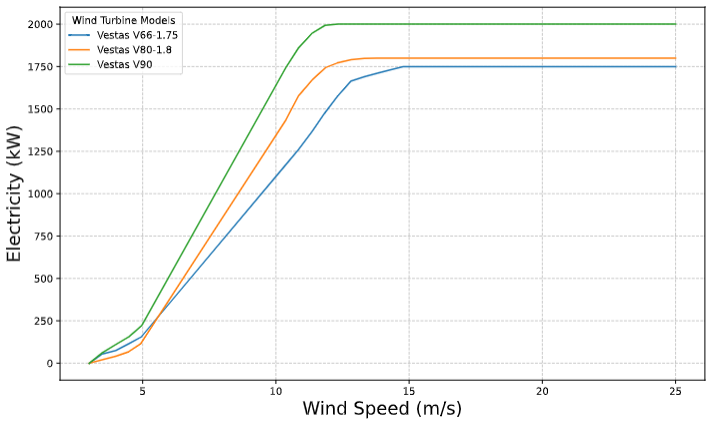


the Curtaillement is at a value of 1003.420692764969 MWh
the CO2 emissions are at a value of 75.55014174895828 Tonnes
the installed capacity of Wind, PV, Hydro and Biomass are respectively at values of [2.00548674 2.28269717 1.         0.64991057] MW
the installed capacity of storage is at a value of 27.89211576595016 MW


<Axes: xlabel='Technologies'>

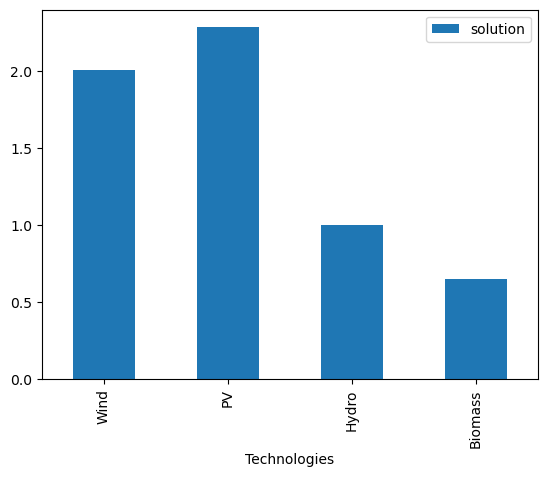

In [11]:
crt = curt.solution.sum().item()
co2e = co2_emissions.solution.item()
ctech = cap_tech.solution.values #[1.69212937, 1.87492759, 1.00104827]
csto = cap_sto.solution.item() #[26.32642663]
print(f'the Curtaillement is at a value of {crt} MWh')
print(f'the CO2 emissions are at a value of {co2e} Tonnes')
print(f'the installed capacity of Wind, PV, Hydro and Biomass are respectively at values of {ctech} MW')
print(f'the installed capacity of storage is at a value of {csto} MW')
m.objective
cap_tech.solution.to_dataframe().plot(kind="bar")


In [12]:
# import pygwalker as pyg
# generation_df = m.solution.to_dataframe().reset_index()
# pyg.walk(generation_df)

In [13]:
price_elec = total_cost.solution/g.solution.sum()
print(f"the price of electricity is at {price_elec.values:.1f} euro per MWh")


the price of electricity is at 101.3 euro per MWh


# Base case considering Wind as it should

In [14]:
# formula from the course of meca0450 ( a  bit modified as we do not dimensionate a turbine, but we use the dimensions of an existing turbine)
# the density of air is also available in renewable ninja. We take it there.
def TauWindEnergy_custom(
    rho,
    Vinf,        # Vitesse du vent (m/s), scalaire ou tableau NumPy
    D,           # Diamètre du rotor (m)
    Prated,      # Puissance nominale de la turbine (kW)
    Cpmax=0.4721,       # Coefficient de puissance maximal (sans unité)
    eta_alt=0.9, # Rendement de l’alternateur
    tau_loss=0.02, # Fraction de pertes mécaniques
    nw=0.2       # Exposant correctif sur la vitesse
):
    # 2) Puissance extraite (en kW)
    #    P_raw = 0.5 * rho * surface * Cpmax * (V_effective)**3
    surface = np.pi * (D/2.)**2
    V_eff = Vinf * (D/10.)**nw
    P_raw = 0.5 * rho * surface * Cpmax * V_eff**3  # en W

    # 3) On retire les pertes mécaniques, on applique le rendement, et on convertit en kW
    P_loss = Prated*1e3 * tau_loss     # en W
    P_avail = eta_alt*(P_raw - P_loss) / 1e3  # en kW

    # 4) Normalisation / écrêtage entre 0 et 1
    tau = np.clip(P_avail/Prated, 0., 1.)

    # 5) Renvoi sous forme de liste Python
    return tau.tolist()
pd_rho = pd.read_csv("Data/rho.csv",index_col=0)
rho = pd_rho["rhoa"]
pd_Windspeed = pd.read_csv("Data/Windspeed.csv",index_col=0)
windspeed = pd_Windspeed["wind_speed"]
windspeed = windspeed.where(windspeed > 3, 0)
windspeed = windspeed.where(windspeed < 25, 0)

AF_Ren = pd.Series(TauWindEnergy_custom(rho=rho, Vinf=windspeed, D=66, Prated=1650)) # Model Vestas V66 1650 as we used it for renewable ninja.-> better to compare the AF
AF = pd.read_csv('Data/AF.csv',index_col=0) # AF is given in the file only for the renewables, we need to add columns for the other technologies.

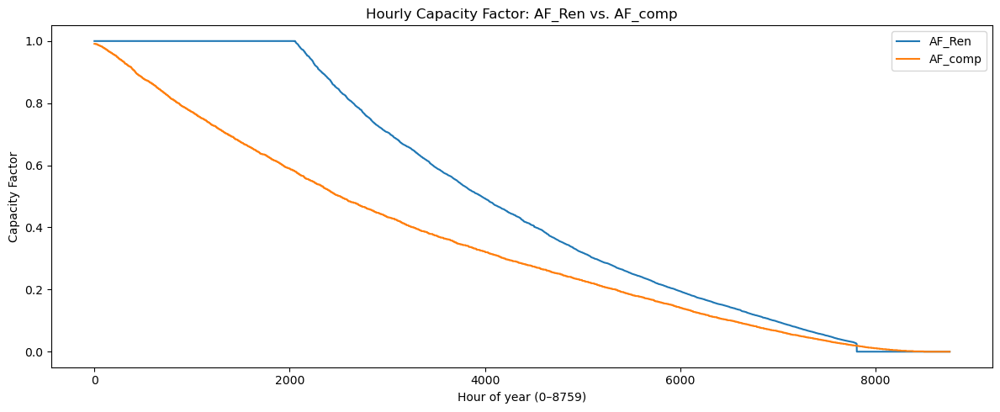

In [15]:
AF_Ren_comp = AF_Ren.sort_values(ascending=False)
AF_comp = AF['Wind'].sort_values(ascending=False)


plt.figure(figsize=(12, 5))
plt.plot(AF_Ren_comp.values,  label="AF_Ren")
plt.plot(AF_comp.values, label="AF_comp")
plt.xlabel("Hour of year (0–8759)")
plt.ylabel("Capacity Factor")
plt.title("Hourly Capacity Factor: AF_Ren vs. AF_comp")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

In [16]:
AF_Ren

0       0.058522
1       0.040639
2       0.044056
3       0.066685
4       0.086838
          ...   
8755    0.109172
8756    0.140985
8757    0.166765
8758    0.153413
8759    0.096941
Length: 8760, dtype: float64

The results clearly show a different curve with the typical shape of a wind turbine production. We will thus use this AF for wind instead of the previous one given by renewable.ninja

In [17]:
### Loading the data and convert to xarray DataSet
# Technologies data:
tech_param = pd.read_csv('Data/technologies.csv',index_col=0)

# Storages data
sto_param = pd.read_csv("Data/storage_technologies.csv", index_col=0).to_xarray()

# Demand:
demand = pd.read_csv('Data/demand_h_c.csv',index_col=0).to_xarray() * 1e-3 #en MWh#pd.read_csv('Data/demand_hourly.csv',index_col=0).to_xarray() * 1e-3 #en MWh

# Renewable generation:
AF = pd.read_csv('Data/AF.csv',index_col=0) # AF is given in the file only for the renewables, we need to add columns for the other technologies.
AF['Wind'] = AF_Ren.values
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
AF['Hydro'] = AF_hydro.values
AF['Hydro'] = AF['Hydro'].where(AF['Hydro'] < 1, 1)
for tech in tech_param.index:
    if tech not in AF.columns:
        AF.loc[:,tech] = tech_param.loc[tech, "Availability"] 
tech_param = tech_param.to_xarray()

# Global parameters:
general_parameters = pd.read_csv('Data/global_parameters.csv',index_col=0)


### -----------------------------------------------------------------------------------
#Sets
Time = demand.get_index("Time")
Tech = tech_param.get_index("Technologies")
Sto = sto_param.get_index("Storages")

# Technologies related
TECH_MAX_CAP = tech_param['Maximum capacity']
MARGINAL_FUEL_COST = tech_param['Fuel costs']/tech_param['Rated efficiency']
CO2_INTENSITY = tech_param['Fuel CO2 content']/tech_param['Rated efficiency']
TECH_PHI = tech_param["Discount rate"]/(1-(1+tech_param["Discount rate"])**(-tech_param["Lifetime"]))
TECH_IC = TECH_PHI*tech_param['Investment cost']
DELTA_MAX_UP = tech_param['Ramp-up rate']
DELTA_MAX_DOWN = tech_param['Ramp-down rate']
AF = AF[Tech]
AF  = xr.DataArray(AF,coords=[Time,Tech])
LEGACY = tech_param["Legacy capacity"]


# Storage related
STO_MAX_CAP = sto_param["Maximum capacity"]
STO_PHI = sto_param["Discount rate"]/(1-(1+sto_param["Discount rate"])**(-sto_param["Lifetime"]))
STO_IC = STO_PHI*sto_param["Investment cost"]
EFF_D = sto_param["Discharge efficiency"]
EFF_C = sto_param["Charge efficiency"]
SOC_MAX = sto_param["Maximum state of charge"]
SOC_MIN = sto_param["Minimum state of charge"]
STO_dT = sto_param["Storage duration"]


# Configuration and scenario parameters
DEMAND = demand["Demand"]
TS = float(general_parameters.Value.loc['Time step'])
VOLL = float(general_parameters.Value.loc['VOLL'])
CO2_PRICE = float(general_parameters.Value.loc['CO2_price'])
CO2_BOUND = 68744363 # float(general_parameters.Value.loc['CO2_bound']) 

## Model

In [18]:
### Create the model instance

m = Model()

### Create the variables

cap_tech = m.add_variables(lower = 0, coords = [Tech], name = 'cap_tech') # Installed capacity of the technologies [MW]
g = m.add_variables(lower = 0, coords = [Tech, Time], name = 'g')        # Generated power [MW]
fcd = m.add_variables(lower = 0, coords = [Tech, Time], name = 'fcd')    # Fuel cost definition [EUR/h]

cap_sto = m.add_variables(lower = 0, coords = [Sto], name = 'cap_sto') # Installed capacity of the storages [MW]
sd = m.add_variables(lower = 0, coords = [Sto, Time], name = 'sd')     # Storage discharge [MW]
sc = m.add_variables(lower = 0, coords = [Sto, Time], name = 'sc')     # Storage charge [MW]
se = m.add_variables(lower = 0, coords = [Sto, Time], name = 'se')     # Stored energy [MWh]

co2_emissions =  m.add_variables(lower = 0, name = 'co2_emissions')     # Combined CO2 emissions [tCO2eq]
ens = m.add_variables(lower = 0, coords = [Time], name = 'ens')           # Energy not served [MWh]

curt = m.add_variables(lower = 0, coords = [Time])                      # Curtailment [MWh]

# Create the constraints

# Technology sizing
cap_max_tech = m.add_constraints( cap_tech <= TECH_MAX_CAP, name = 'cap_max_tech') # Installed capasity of the tech [MW]
power_max = m.add_constraints( g<= AF * cap_tech, name = 'power_max_tech') # maximum generated power

# Ramping up/down constraints
power_rampup_initial = m.add_constraints(g.loc[:,:Time[0]] - g.loc[:,Time[len(Time)-1]:] <= DELTA_MAX_UP*cap_tech , name = 'power_rampup_initial')
power_rampup = m.add_constraints(g.loc[:, Time[1:]] <= g.shift(Time = 1) + DELTA_MAX_UP*cap_tech, name = 'power_rampup')

power_rampdown_initial = m.add_constraints(g.loc[:,:Time[0]] - g.loc[:,Time[len(Time)-1]:]  >= - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown_initial')
power_rampdown = m.add_constraints(g.loc[:, Time[1:]]>= g.shift(Time = 1) - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown')


# Storage sizing + Initial condition
cap_max_sto = m.add_constraints( cap_sto <= STO_MAX_CAP, name = 'cap_max_sto') #max storage depending on the country
storage_initial_state = m.add_constraints(se.loc[:,:Time[0]] - se.loc[:,Time[len(Time)-1]:]  == TS*EFF_C*sc.loc[:,Time[len(Time)-1]:] - TS*sd.loc[:,Time[len(Time)-1]:]/EFF_D, name = 'storage_initial_state')
storage_balance = m.add_constraints(se.loc[:,Time[1:]] - se.shift(Time = 1) == TS*EFF_C*sc.loc[:,Time[1:]] -TS*sd.loc[:,Time[1:]]/EFF_D, name = 'storage_balance')
storage_charge_max = m.add_constraints( sc <= cap_sto/STO_dT, name = 'storage_charge_max') 
storage_discharge_max = m.add_constraints( sd <= cap_sto/STO_dT, name = 'storage_discharge_max') 
storage_energy_max = m.add_constraints( se <= cap_sto * SOC_MAX , name = 'storage_energy_max')
storage_energy_min = m.add_constraints( se >= cap_sto * SOC_MIN , name = 'storage_energy_min')

# Market clearing
mcc = m.add_constraints( g.sum(dims = 'Technologies') + (sd - sc).sum(dims = 'Storages') + ens == DEMAND, name = 'mcc') # demand = generation + discharge - charge + energy_not_served(ens)

# Limit on energy not served
ens_lim = m.add_constraints(ens<=DEMAND, name = 'ens_lim')

# Costs
fuel_cost = m.add_constraints(fcd == MARGINAL_FUEL_COST*g, name="fuel_cost")

# CO2 Emissions
co2_account = m.add_constraints(co2_emissions == (CO2_INTENSITY * g).sum(dims = ['Technologies', 'Time']), name = 'co2_account') #co2 intensity 
co2_bound = m.add_constraints(co2_emissions <= CO2_BOUND, name = 'co2_bound')

### Curtailment evaluation.
RE_MASK = xr.DataArray(np.array([1,1,1,0]), coords = [Tech])
curt_const = m.add_constraints(curt == ((AF*cap_tech-g)*RE_MASK).sum(dims = 'Technologies') , name = 'curt')

# Add the objective function
total_cost = (TECH_IC*cap_tech).sum(dims='Technologies') + (STO_IC*cap_sto).sum(dims='Storages') + (TS*fcd).sum(dims=['Technologies', 'Time']) + (VOLL*TS*ens).sum(dims = 'Time')
m.add_objective(total_cost)

In [19]:
#m.solve("gurobi")
m.solve("highs")

Writing continuous variables.: 100%|██████████| 10/10 [00:00<00:00, 71.53it/s]


Running HiGHS 1.10.0 (git hash: fd86653): Copyright (c) 2025 HiGHS under MIT licence terms
LP   linopy-problem-f52bkues has 210255 rows; 113886 cols; 558771 nonzeros
Coefficient ranges:
  Matrix [1e-03, 4e+01]
  Cost   [1e+00, 6e+05]
  Bound  [0e+00, 0e+00]
  RHS    [7e-01, 7e+07]
Presolving model
150475 rows, 73524 cols, 457293 nonzeros  0s
Dependent equations search running on 21126 equations with time limit of 1000.00s
Dependent equations search removed 0 rows and 0 nonzeros in 0.00s (limit = 1000.00s)
145312 rows, 68369 cols, 472065 nonzeros  0s
Presolve : Reductions: rows 145312(-64943); columns 68369(-45517); elements 472065(-86706)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Pr: 8760(8057.79) 0s
       8568     8.5116756496e+05 Pr: 16630(17261.9); Du: 0(1.83264e-07) 6s
      15006     1.1598126718e+06 Pr: 22415(38634.9); Du: 0(9.87283e-08) 11s
      20345     1.19307667

('ok', 'optimal')

## Data Analysis

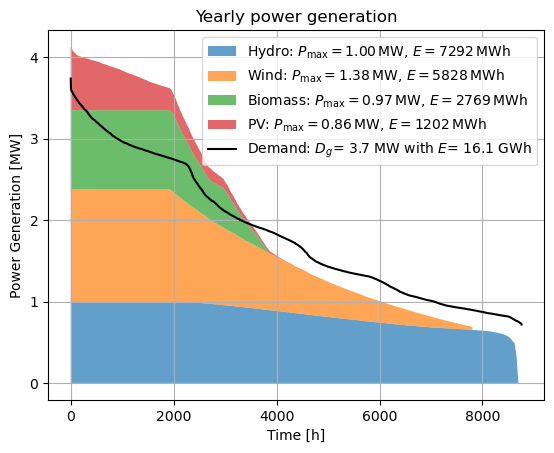

In [20]:
storage_discharge_df = sd.solution.to_dataframe().unstack(level=0)
storage_discharge_df.columns = storage_discharge_df.columns.droplevel(0)
storage_charge_df = sc.solution.to_dataframe().unstack(level=0)
storage_charge_df.columns = storage_charge_df.columns.droplevel(0)

Demand_ld = pd.DataFrame(index=Time)
Demand_ld['Demand'] =  demand["Demand"]
Demand_ld['interval'] = 1
Demand_ld = Demand_ld.sort_values(by=['Demand'], ascending = False)
Demand_ld['duration'] = Demand_ld['interval'].cumsum()

generation_df = g.solution.to_dataframe().unstack(level=0)
generation_df.columns = generation_df.columns.droplevel(0)
total_production = generation_df.sum()
sorted_columns = total_production.sort_values(ascending=False).index

generation_df = generation_df[sorted_columns].apply(lambda x: x.sort_values(ascending=False).values, axis=0)

bottom_stack = np.zeros(8760)

for column in generation_df.columns:
    plt.fill_between(range(8760), bottom_stack, bottom_stack + generation_df[column], label = (r'%s: $P_\mathrm{max}=%.2f\,\mathrm{MW}$, 'r'$E=%.0f\,\mathrm{MWh}$') % (column, cap_tech.solution.loc[column], g.solution.loc[column].sum()), alpha=0.7)
    bottom_stack += generation_df[column]
plt.plot()
plt.plot(Demand_ld['duration'], Demand_ld['Demand'], 'k-', label=r'Demand: $D_g$= %.1f MW with $E$= %.1f GWh' %(demand["Demand"].max(), demand["Demand"].sum()*1e-3))
plt.xlabel("Time [h]")
plt.ylabel("Power Generation [MW]")
plt.title("Yearly power generation")
plt.legend()
plt.grid()
plt.savefig("./plot/energymix.pdf", transparent=True, dpi=300, bbox_inches='tight')
plt.show()

the Curtaillement is at a value of 208.1948173169232 MWh
the CO2 emissions are at a value of 162.8758330245494 Tonnes
the installed capacity of Wind, PV, Hydro and Biomass are respectively at values of [1.37731091 0.86416525 1.         0.97214093] MW
the installed capacity of storage is at a value of 35.45954644072914 MW


<Axes: xlabel='Technologies'>

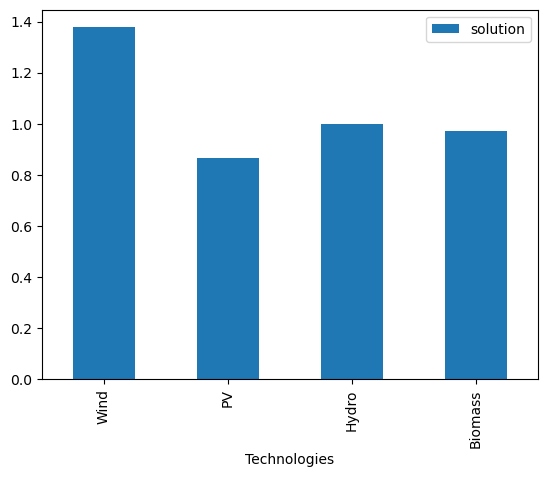

In [21]:
crt = curt.solution.sum().item()
co2e = co2_emissions.solution.item()
ctech = cap_tech.solution.values #[1.69212937, 1.87492759, 1.00104827]
csto = cap_sto.solution.item() #[26.32642663]
print(f'the Curtaillement is at a value of {crt} MWh')
print(f'the CO2 emissions are at a value of {co2e} Tonnes')
print(f'the installed capacity of Wind, PV, Hydro and Biomass are respectively at values of {ctech} MW')
print(f'the installed capacity of storage is at a value of {csto} MW')
m.objective
cap_tech.solution.to_dataframe().plot(kind="bar")

In [22]:
cap_tech.solution

<xarray.DataArray 'solution' (Technologies: 4)> Size: 32B
array([1.37731091, 0.86416525, 1.        , 0.97214093])
Coordinates:
  * Technologies  (Technologies) object 32B 'Wind' 'PV' 'Hydro' 'Biomass'

In [23]:
cap_sto.solution

<xarray.DataArray 'solution' (Storages: 1)> Size: 8B
array([35.45954644])
Coordinates:
  * Storages  (Storages) object 8B 'Pumped_Hydro'

In [24]:
price_elec = total_cost.solution/g.solution.sum()
print(f"the price of electricity is at {price_elec.values:.1f} euro per MWh")


the price of electricity is at 103.4 euro per MWh


# uncertainties

Uncertainties could be takle in different way. We must think about what could change in the project if we take another year, or an increase in the size of the campus.
We thus will explore the following uncertainites :

    - An increase in the total demand as the campus grow and as the EV's are more and more used ( for example +15% or + 30% )

    - Variation of the weather from one year to another that could lead to less or more favorable PV or Wind AF
    
    - Variation the flow in Saint Laurent due to a dry year ( as a deacrease in the flux would particulary affect us because we use a run-of-river power plant that is on the edge of the river.)


## Demand Growth in the following years

In this case, we have different scenario of growth of the campus. We are plaaning the current energy mix, but still want to take account of the futur growth of the Campus. 
The goal is thus to have something that is working now, but that can be scale easily if needed.
For example, Germany recently approved their network investing plan NEP 2025-2037/2045 Where they consider an electrical consumption 2.5 times greater than the current one. For the case of our campus, we consider the current case computed in the previous part as legacy. 
Then we consider two possible cases. One with a consumption 1.5 time greater than the current one, and one 2.5 time greater as well.

As the consumption will be bigger, we consider that the hydro power capacity do not change, that the Biomass capacity is still restricted for area purpose, and that more storage can be considered as there will probably be more need. The new storage will be considered as batteries storage and will thus have other cost and properties than pumped storage.

In [25]:
LEGACY_tech = cap_tech.solution # solution of previous optimisation
LEGACY_sto = cap_sto.solution
new_sto = xr.DataArray(
    data=[LEGACY_sto.sel(Storages="Pumped_Hydro").item(), 0.0],  # value for Pumped_Hydro, then 0 for Batteries
    coords={"Storages": ["Pumped_Hydro", "Batteries"]},
    dims=["Storages"],
    name="solution"
)
LEGACY_sto = new_sto

In [26]:
# Technologies data:
tech_param = pd.read_csv('Data/technologies.csv',index_col=0)

# Storages data
sto_param = pd.read_csv("Data/uncertainty/storage_technologies.csv", index_col=0).to_xarray()

# Demand:
demand = pd.read_csv('Data/demand_h_c.csv',index_col=0).to_xarray() * 1e-3 #en MWh#pd.read_csv('data/demand_hourly.csv',index_col=0).to_xarray() * 1e-3 #en MWh
demand_10 = pd.Series(demand["Demand"].values * 1.5)
demand_30 = pd.Series(demand["Demand"].values * 2.5)

Time = demand.get_index("Time") 


# Renewable generation:
AF = pd.read_csv('Data/AF.csv',index_col=0) # AF is given in the file only for the renewables, we need to add columns for the other technologies.
AF['Wind'] = AF_Ren.values
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
AF['Hydro'] = AF_hydro.values
AF['Hydro'] = AF['Hydro'].where(AF['Hydro'] < 1, 1)
for tech in tech_param.index:
    if tech not in AF.columns:
        AF.loc[:,tech] = tech_param.loc[tech, "Availability"] 
tech_param = tech_param.to_xarray()

# Global parameters:
general_parameters = pd.read_csv('Data/global_parameters.csv',index_col=0)
###--------------------------------------------------------------------------------------------------
#Sets
Tech = tech_param.get_index("Technologies")
Sto = sto_param.get_index("Storages")
Scen = ["1.5", "2.5"]
Scen = pd.Index(Scen, name="Scenarios")
demand = xr.DataArray( np.vstack([demand_10.values, demand_30.values]), dims=("Scenarios","Time"), coords={"Scenarios": Scen, "Time": Time}, name="Demand")

# probability of scenarios
pi = pd.DataFrame([0.3,0.7], index=Scen, columns = ["Probability"]) #very low proba to keep as it is, but higher proba to have a growth
PI = xr.DataArray(pi["Probability"], coords=[Scen])

# Technologies related
TECH_MAX_CAP = tech_param['Maximum capacity']
MARGINAL_FUEL_COST = tech_param['Fuel costs']/tech_param['Rated efficiency']
CO2_INTENSITY = tech_param['Fuel CO2 content']/tech_param['Rated efficiency']
TECH_PHI = tech_param["Discount rate"]/(1-(1+tech_param["Discount rate"])**(-tech_param["Lifetime"]))
TECH_IC = TECH_PHI*tech_param['Investment cost']
DELTA_MAX_UP = tech_param['Ramp-up rate']
DELTA_MAX_DOWN = tech_param['Ramp-down rate']
AF = AF[Tech]
AF  = xr.DataArray(AF,coords=[Time,Tech])





# Storage related
STO_MAX_CAP = sto_param["Maximum capacity"]
STO_PHI = sto_param["Discount rate"]/(1-(1+sto_param["Discount rate"])**(-sto_param["Lifetime"]))
STO_IC = STO_PHI*sto_param["Investment cost"]
EFF_D = sto_param["Discharge efficiency"]
EFF_C = sto_param["Charge efficiency"]
SOC_MAX = sto_param["Maximum state of charge"]
SOC_MIN = sto_param["Minimum state of charge"]
STO_dT = sto_param["Storage duration"]


# Configuration and scenario parameters
DEMAND = demand
TS = float(general_parameters.Value.loc['Time step'])
VOLL = float(general_parameters.Value.loc['VOLL'])
CO2_PRICE = float(general_parameters.Value.loc['CO2_price'])
CO2_BOUND = 68744363


In [27]:
Scen

Index(['1.5', '2.5'], dtype='object', name='Scenarios')

### Optimization problem

In [28]:
### Create the model instance

m = Model()

###__________________ Create the variables____________________________________________________________________________________
# We consider a cap_tech and cap_sto that can be changed from scenario to scenario. This allow us to have no real limit on it, and to let the solver show solutions. After that, we discuss 
#how much we should install according to the present and futur needs.

cap_tech = m.add_variables(lower = 0, coords = [Tech, Scen], name = 'cap_tech') # Installed capacity of the technologies [MW]
exp_tech = m.add_variables(lower = 0, coords = [Tech, Scen], name='exp_tech') # expansion to make the between leg & tech
g = m.add_variables(lower = 0, coords = [Tech, Scen, Time], name = 'g')        # Generated power [MW]
fcd = m.add_variables(lower = 0, coords = [Tech, Scen, Time], name = 'fcd')    # Fuel cost definition [EUR/h]

cap_sto = m.add_variables(lower = 0, coords = [Sto, Scen], name = 'cap_sto') # Installed capacity of the storages [MW]
exp_sto = m.add_variables(lower = 0, coords = [Sto, Scen], name = 'exp_sto') 
sd = m.add_variables(lower = 0, coords = [Sto, Scen, Time], name = 'sd')     # Storage discharge [MW]
sc = m.add_variables(lower = 0, coords = [Sto, Scen, Time], name = 'sc')     # Storage charge [MW]
se = m.add_variables(lower = 0, coords = [Sto, Scen, Time], name = 'se')     # Stored energy [MWh]

co2_emissions =  m.add_variables(lower = 0, coords = [Scen], name = 'co2_emissions')     # Combined CO2 emissions [tCO2eq]
ens = m.add_variables(lower = 0, coords = [Scen, Time], name = 'ens')           # Energy not served [MWh]

curt = m.add_variables(lower = 0, coords = [Scen, Time])                      # Curtailment [MWh]

costs = m.add_variables(lower = 0, coords = [Scen])                           #Costs of different scenarios
#___________________ Create the constraints_____________________________________________________________________________________

# Technology sizing
cap_max_tech = m.add_constraints(cap_tech <= TECH_MAX_CAP, name = "cap_max_tech")
power_max = m.add_constraints(g <= AF*cap_tech, name= 'power_max')
expansion_tech = m.add_constraints(exp_tech >= cap_tech - LEGACY_tech, name ='expansion_tech')


# Ramping up/down constraints
power_rampup_initial = m.add_constraints(g.loc[:,:,:Time[0]] - g.loc[:,:,Time[len(Time)-1]:] <= DELTA_MAX_UP*cap_tech , name = 'power_rampup_initial')
power_rampup = m.add_constraints(g.loc[:,:,Time[1:]] <= g.shift(Time = 1) + DELTA_MAX_UP*cap_tech, name = 'power_rampup')

power_rampdown_initial = m.add_constraints(g.loc[:,:,:Time[0]] - g.loc[:,:,Time[len(Time)-1]:]  >= - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown_initial')
power_rampdown = m.add_constraints(g.loc[:,:,Time[1:]]>= g.shift(Time = 1) - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown')


# Storage sizing + Initial condition
cap_max_sto = m.add_constraints(cap_sto <= STO_MAX_CAP, name = "cap_max_sto")
expansion_sto = m.add_constraints(exp_sto >= cap_sto - LEGACY_sto, name ='expansion_sto')
storage_initial_state = m.add_constraints(se.loc[:,:,:Time[0]] - se.loc[:,:,Time[len(Time)-1]:]  == TS*EFF_C*sc.loc[:,:,Time[len(Time)-1]:] - TS*sd.loc[:,:,Time[len(Time)-1]:]/EFF_D, name = 'storage_initial_state')
storage_balance = m.add_constraints(se.loc[:,:,Time[1:]] - se.shift(Time = 1) == TS*EFF_C*sc.loc[:,:,Time[1:]] -TS*sd.loc[:,:,Time[1:]]/EFF_D, name = 'storage_balance')
storage_charge_max = m.add_constraints(sc <= cap_sto/STO_dT, name = 'storage_charge_max')
storage_discharge_max = m.add_constraints(sd <= cap_sto/STO_dT, name = 'storage_discharge_max')
storage_energy_max = m.add_constraints(se <= SOC_MAX*cap_sto, name = 'storage_energy_max' )
storage_energy_min = m.add_constraints(se >= SOC_MIN*cap_sto, name = 'storage_energy_min' )

# Market clearing
mcc = m.add_constraints(g.sum(dims = 'Technologies') + ens + (sd - sc).sum(dims = "Storages") == DEMAND, name = 'mcc')

# Limit on energy not served
ens_lim = m.add_constraints(ens<=DEMAND, name = 'ens_lim')

# Costs
fuel_cost = m.add_constraints(fcd == MARGINAL_FUEL_COST*g, name="fuel_cost")

# CO2 Emissions
co2_account =  m.add_constraints(co2_emissions == (CO2_INTENSITY*g).sum(dims=["Technologies", "Time"]), name="co2 account")
co2_bound = m.add_constraints(co2_emissions <= CO2_BOUND, name = "co2_bound")

### Curtailment evaluation.
RE_MASK = xr.DataArray(np.array([1,1,0,0]), coords = [Tech])
curt_eval = m.add_constraints(curt == ((AF*cap_tech-g)*RE_MASK).sum(dims = 'Technologies') , name = 'curt')

cost_scenarios = m.add_constraints(costs == ((TECH_IC*exp_tech).sum(dim="Technologies") + 
                                              (STO_IC*exp_sto).sum(dim="Storages") + 
                                              ((TS*fcd).sum(dims = ['Technologies', 'Time']) + 
                                               (VOLL*TS*ens).sum(dims ='Time') + co2_emissions*CO2_PRICE)))  # cap_tech & cap_sto -> exp_tech & exp_sto
# __________________________________________________________--Add the objective function__________________________________________________
total_cost = ((PI*((TECH_IC*exp_tech).sum(dim="Technologies") + 
              (STO_IC*exp_sto).sum(dim="Storages") + 
              (TS*fcd).sum(dims = ['Technologies', 'Time']) + (VOLL*TS*ens).sum(dims ='Time') + co2_emissions*CO2_PRICE)).sum(dim="Scenarios"))
m.add_objective(total_cost)

In [29]:
#m.solve("gurobi")
m.solve("highs")

Writing continuous variables.: 100%|██████████| 13/13 [00:00<00:00, 39.31it/s]


Running HiGHS 1.10.0 (git hash: fd86653): Copyright (c) 2025 HiGHS under MIT licence terms
LP   linopy-problem-079j6f0y has 508126 rows; 280348 cols; 1415424 nonzeros
Coefficient ranges:
  Matrix [1e-03, 6e+05]
  Cost   [3e-01, 4e+05]
  Bound  [0e+00, 0e+00]
  RHS    [9e-01, 7e+07]
Presolving model
370434 rows, 199014 cols, 1054160 nonzeros  0s
Dependent equations search running on 48855 equations with time limit of 1000.00s
Dependent equations search removed 0 rows and 0 nonzeros in 0.01s (limit = 1000.00s)
332275 rows, 178389 cols, 1078232 nonzeros  1s
Presolve : Reductions: rows 332275(-175851); columns 178389(-101959); elements 1078232(-337192)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Pr: 17520(37066.1) 2s
       2876     3.1529165861e-01 Pr: 44620(257921); Du: 0(7.87157e-08) 7s
       7301     7.9671260017e-01 Pr: 68839(5.12029e+06); Du: 0(4.61769e-07) 12s
      13918 

('ok', 'optimal')

### Post Process

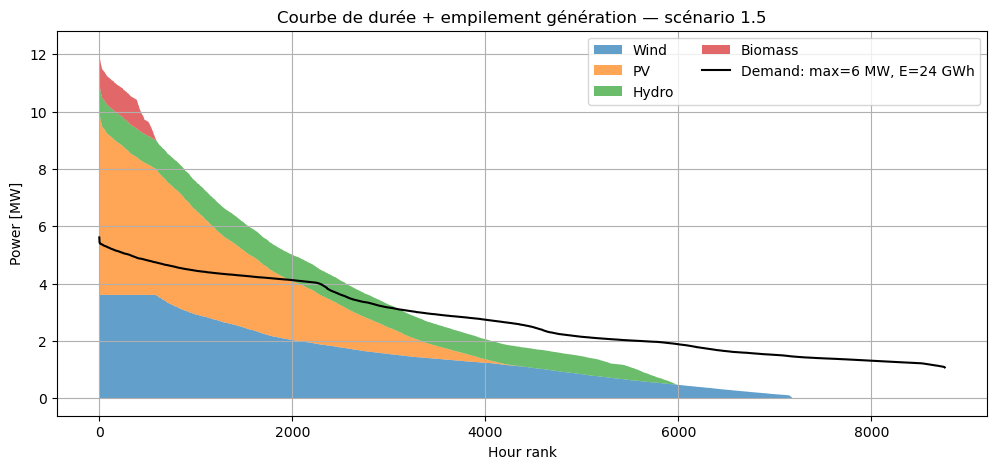

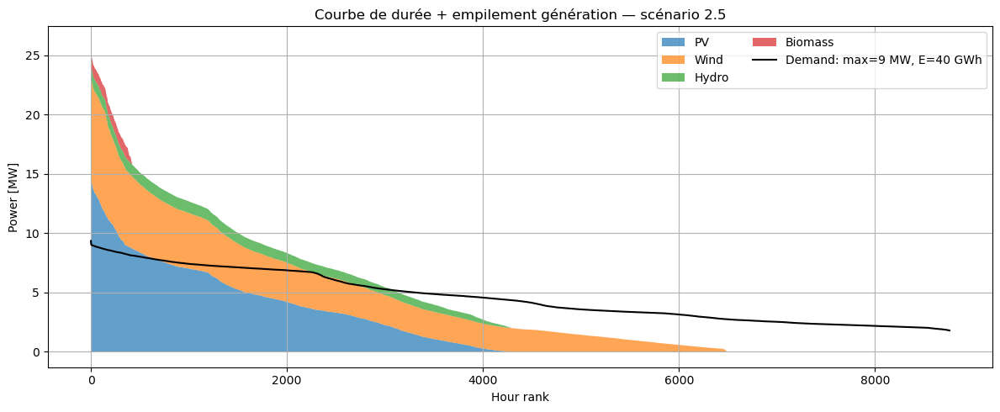

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# On suppose que :
#  - `demand`   est votre DataArray dims=("Scenarios","Time")
#  - `g, cap_tech, exp_tech, sc, sd` sont déjà résolus et disponibles

for scenario in Scen:
    # --- 1) Préparer la production générée par techno, triée pour la courbe de durée ---
    # to_dataframe(name="gen") crée une colonne 'gen'
    gen_df = g.solution.to_dataframe(name="gen")\
                .gen.unstack("Technologies")      # cols = techno, index = (Scenario,Time)
    gen_ts = gen_df.loc[scenario]                 # DataFrame index=Time, cols=Technologies

    # On ordonne les techs par production totale descendante
    ordre_tech = gen_ts.sum().sort_values(ascending=False).index

    # Pour chaque techno on trie ses valeurs (desc) et reconstitue un DF
    gen_dur = pd.DataFrame(
        {tech: np.sort(gen_ts[tech].values)[::-1]
         for tech in ordre_tech},
        index=np.arange(len(Time))
    )

    # --- 2) Préparer la capacité legacy empilée (grisée) ---
    # legacy_cap = cap_tech – exp_tech pour ce scénario
    legacy = (cap_tech.solution - exp_tech.solution)\
                .sel(Scenarios=scenario)\
                .to_series()[ordre_tech]        # Series index=Technologies

    # --- 3) Tracer tout ça ---
    plt.figure(figsize=(12,5))
    bottom_legacy = np.zeros(len(Time))
    bottom_gen    = np.zeros(len(Time))

    # # 3a) legacy en gris clair
    # for tech in ordre_tech:
    #     cap_val = legacy.loc[tech]
    #     plt.fill_between(
    #         np.arange(len(Time)),
    #         bottom_legacy,
    #         bottom_legacy + cap_val,
    #         color="lightgray", alpha=0.3,
    #         label=f"{tech} legacy" if tech==ordre_tech[0] else None
    #     )
    #     bottom_legacy += cap_val

    # 3b) production effective, empilée couleur normale
    for tech in ordre_tech:
        vals = gen_dur[tech].values
        plt.fill_between(
            np.arange(len(Time)),
            bottom_gen,
            bottom_gen + vals,
            label=tech, alpha=0.7
        )
        bottom_gen += vals

    # # 3c) pumped-hydro charge / discharge (toujours trié desc)
    # #    on extrait la série, on trie, puis on empile
    # sc_df = sc.solution.to_dataframe(name="sc").sc.unstack("Storages").loc[scenario]
    # sd_df = sd.solution.to_dataframe(name="sd").sd.unstack("Storages").loc[scenario]
    # charge_dur    = np.sort(sc_df["Pumped_Hydro"].values)[::-1]
    # discharge_dur = np.sort(sd_df["Pumped_Hydro"].values)[::-1]

    # plt.fill_between(
    #     np.arange(len(Time)),
    #     bottom_gen,
    #     bottom_gen + charge_dur,
    #     label="PH_charge", alpha=0.7, hatch="o"
    # )
    # plt.fill_between(
    #     np.arange(len(Time)),
    #     np.zeros(len(Time)),
    #     discharge_dur,
    #     label="PH_discharge", alpha=0.7, hatch="O"
    # )

    # --- 4) Courbe de durée de la demande pour CE scénario ---
    dem_ts = demand.sel(Scenarios=scenario).to_series()
    dem_dur = dem_ts.sort_values(ascending=False).values
    hrs = np.arange(len(Time))
    plt.plot(
        hrs, dem_dur,
        "k-",
        label=(
            rf"Demand: max={dem_ts.max():.0f} MW, "
            rf"E={dem_ts.sum()*1e-3:.0f} GWh"
        )
    )

    # --- 5) Mise en forme finale ---
    plt.xlabel("Hour rank")
    plt.ylabel("Power [MW]")
    plt.title(f"Courbe de durée + empilement génération — scénario {scenario}")
    plt.legend(loc="upper right", ncol=2)
    plt.grid(True)

plt.tight_layout()
plt.show()


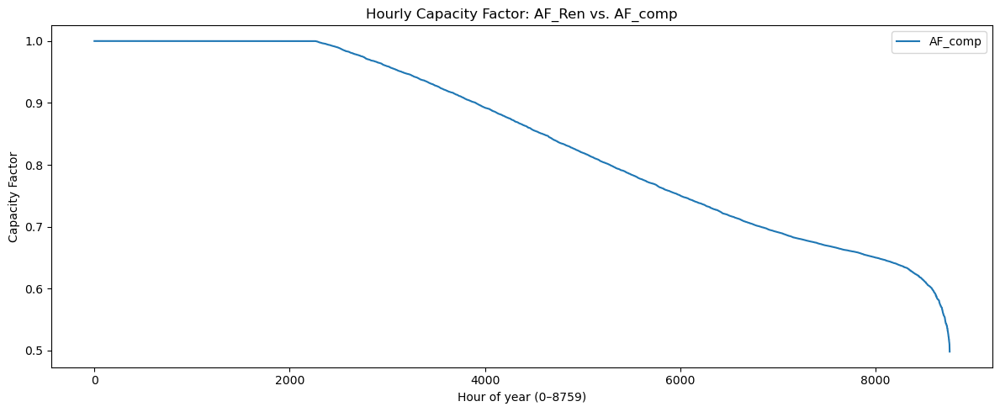

In [31]:
AF = pd.read_csv('Data/AF.csv',index_col=0) # AF is given in the file only for the renewables, we need to add columns for the other technologies.
AF['Wind'] = AF_Ren.values
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
AF['Hydro'] = AF_hydro.values
AF['Hydro'] = AF['Hydro'].where(AF['Hydro'] < 1,1)
AF_comp = AF['Hydro'].sort_values(ascending=False)

plt.figure(figsize=(12, 5))
plt.plot(AF_comp.values, label="AF_comp")
plt.xlabel("Hour of year (0–8759)")
plt.ylabel("Capacity Factor")
plt.title("Hourly Capacity Factor: AF_Ren vs. AF_comp")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

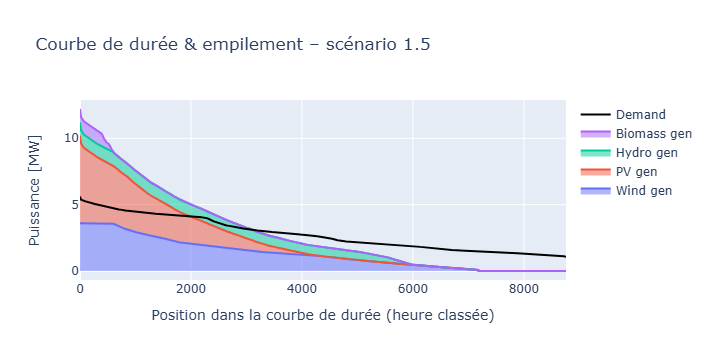

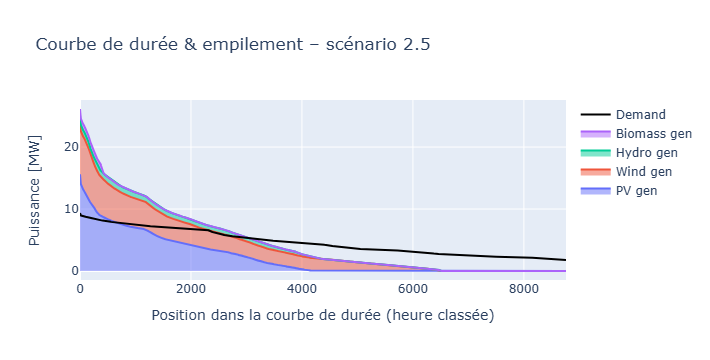

In [32]:
import plotly.graph_objects as go
# 2) Récupération des axes
Scen = demand.coords['Scenarios'].values
Time = demand.coords['Time'].values
hrs  = np.arange(len(Time))

# 3) Boucle de tracé par scénario
for scenario in Scen:
    # 3a) Génération par techno → DataFrame Time×Technologies
    gen_df = (
        g.solution
         .sel(Scenarios=scenario)        # DataArray (Technologies × Time)
         .to_series()                     # Series MultiIndex (Technologies, Time)
         .unstack("Technologies")         # DataFrame index=Time, cols=Technologies
    )
    ordre_tech = gen_df.sum().sort_values(ascending=False).index.tolist()
    gen_dur = {tech: np.sort(gen_df[tech].values)[::-1] for tech in ordre_tech}

    # 3b) Capacité legacy = cap_tech – exp_tech
    legacy = (
        cap_tech.solution - exp_tech.solution
    ).sel(Scenarios=scenario).to_series().reindex(ordre_tech)

    # 3c) Courbe de durée de la demande
    dem_series = demand.sel(Scenarios=scenario).to_series()
    dem_dur    = np.sort(dem_series.values)[::-1]

    # 4) Création du graphique Plotly
    fig = go.Figure()

    # # 4a) Empilement legacy (gris clair)
    # cum = np.zeros(len(hrs))
    # for tech in ordre_tech:
    #     fig.add_trace(go.Scatter(
    #         x=hrs,
    #         y=cum + legacy[tech],
    #         mode='lines',
    #         fill='tonexty',
    #         line=dict(color='lightgray'),
    #         name=f"{tech} legacy",
    #         showlegend=(tech == ordre_tech[0])
    #     ))
    #     cum += legacy[tech]

    # 4b) Empilement génération effective
    cum = np.zeros(len(hrs))
    for tech in ordre_tech:
        vals = gen_dur[tech]
        fig.add_trace(go.Scatter(
            x=hrs,
            y=cum + vals,
            mode='lines',
            fill='tonexty',
            name=f"{tech} gen"
        ))
        cum += vals

    # 4c) Pumped-Hydro charge/discharge
    # sc_ts = sc.solution.sel(Scenarios=scenario).to_series().unstack("Storages")["Pumped_Hydro"]
    # sd_ts = sd.solution.sel(Scenarios=scenario).to_series().unstack("Storages")["Pumped_Hydro"]
    # charge_dur    = np.sort(sc_ts.values)[::-1]
    # discharge_dur = np.sort(sd_ts.values)[::-1]

    # fig.add_trace(go.Scatter(
    #     x=hrs,
    #     y=cum + charge_dur,
    #     mode='lines',
    #     fill='tonexty',
    #     name="PH charge"
    # ))
    # fig.add_trace(go.Scatter(
    #     x=hrs,
    #     y=discharge_dur,
    #     mode='lines',
    #     name="PH discharge"
    # ))

    # 4d) Demande
    fig.add_trace(go.Scatter(
        x=hrs,
        y=dem_dur,
        mode='lines',
        line=dict(color='black'),
        name='Demand'
    ))

    # 5) Mise en page
    fig.update_layout(
        title=f"Courbe de durée & empilement – scénario {scenario}",
        xaxis_title="Position dans la courbe de durée (heure classée)",
        yaxis_title="Puissance [MW]",
        hovermode="x unified"
    )

    fig.show()

In [33]:
costs.solution

<xarray.DataArray 'solution' (Scenarios: 2)> Size: 16B
array([1494848.67993259, 6373395.85531946])
Coordinates:
  * Scenarios  (Scenarios) object 16B '1.5' '2.5'

--- Scenario 1.5 ---
 Price          : 1494849 €
 Curtailment    : 5403.09 MWh
 CO₂ emissions  : 28.79 tonnes

 Installed caps :
Technologies
Wind       3.603606
PV         7.444616
Hydro      1.000000
Biomass    1.000000

 Expansion caps :
Technologies
Wind       2.226295
PV         6.580451
Hydro      0.000000
Biomass    0.027859

 Installed caps :
Storages
Pumped_Hydro    58.00000
Batteries        0.02317

 Expansion caps :
Storages
Pumped_Hydro    22.540454
Batteries        0.023170


--- Scenario 2.5 ---
 Price          : 6373396 €
 Curtailment    : 24648.12 MWh
 CO₂ emissions  : 23.45 tonnes

 Installed caps :
Technologies
Wind        8.536890
PV         18.164688
Hydro       1.000000
Biomass     1.000000

 Expansion caps :
Technologies
Wind        7.159579
PV         17.300523
Hydro       0.000000
Biomass     0.027859

 Installed caps :
Storages
Pumped_Hydro    58.0
Batteries       40.0

 Expansion caps :
Storages
Pumped_Hydro    22.540454
Batteries       40.000000




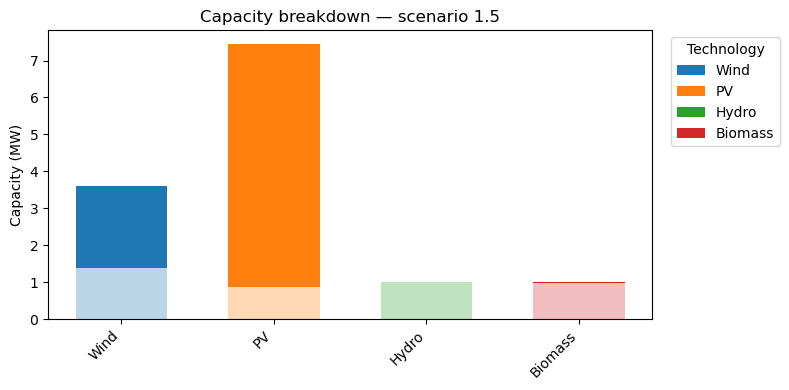

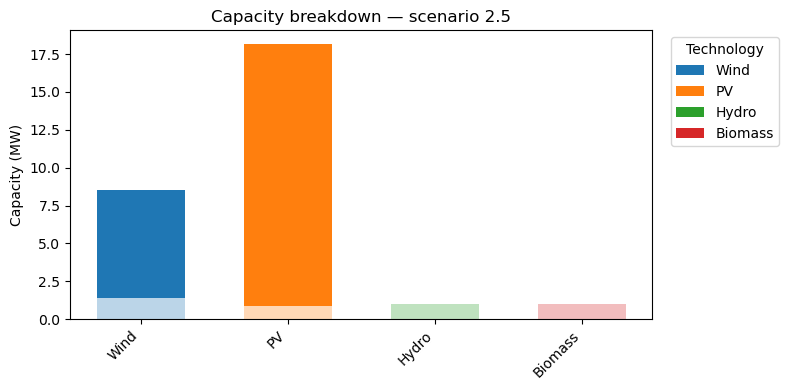

In [34]:
# 1) Build df_cap & df_exp as DataFrames indexed by Technology, columns=Scenario
#    Use to_series() + unstack to get a tech×scenario DataFrame
df_cap = cap_tech.solution.to_series().unstack("Scenarios")
df_exp = exp_tech.solution.to_series().unstack("Scenarios")
df_cap_sto = cap_sto.solution.to_series().unstack("Scenarios")
df_exp_sto = exp_sto.solution.to_series().unstack("Scenarios")

# 2) Force columns into strings (so '1.5' matches, even if coords were floats)
df_cap.columns = df_cap.columns.map(str)
df_exp.columns = df_exp.columns.map(str)
df_cap_sto.columns = df_cap_sto.columns.map(str)
df_exp_sto.columns = df_exp_sto.columns.map(str)

# 3) Also convert your curtailment and CO₂ arrays to have string coords
crt = curt.solution.sum(dim="Time")\
        .assign_coords(Scenarios=curt.coords["Scenarios"].astype(str))
co2e = co2_emissions.solution\
        .assign_coords(Scenarios=co2_emissions.coords["Scenarios"].astype(str))
cos = costs.solution\
        .assign_coords(Scenarios=costs.coords["Scenarios"].astype(str))
# 4) Now loop over the columns of df_cap (the actual scenario labels)
for scen_str in df_cap.columns:
    crt_val = float(crt.sel(Scenarios=scen_str).values)
    co2_val = float(co2e.sel(Scenarios=scen_str).values)
    cost_val = float(cos.sel(Scenarios=scen_str).values)
    print(f"--- Scenario {scen_str} ---")
    print(f" Price          : {cost_val:.0f} €")
    print(f" Curtailment    : {crt_val:.2f} MWh")
    print(f" CO₂ emissions  : {co2_val:.2f} tonnes")
    print()
    print(" Installed caps :")
    print(df_cap[scen_str].to_string())
    print()
    print(" Expansion caps :")
    print(df_exp[scen_str].to_string())
    print()
    print(" Installed caps :")
    print(df_cap_sto[scen_str].to_string())
    print()
    print(" Expansion caps :")
    print(df_exp_sto[scen_str].to_string())
    print()
    print()

# 1) Build DataFrames of Installed vs Expansion by tech×scenario
df_cap = cap_tech.solution.to_series().unstack("Scenarios")
df_exp = exp_tech.solution.to_series().unstack("Scenarios")

# 2) Make sure scenario labels are strings
df_cap.columns = df_cap.columns.map(str)
df_exp.columns = df_exp.columns.map(str)

# 3) Choose one categorical colormap for your techs
techs = df_cap.index.tolist()
cmap = plt.get_cmap("tab10")
colors = {tech: cmap(i % cmap.N) for i, tech in enumerate(techs)}

# 4) Loop over scenarios and plot
for scen in df_cap.columns:
    # compute legacy = installed minus expansion
    legacy = df_cap[scen] - df_exp[scen]
    expansion = df_exp[scen]

    x = np.arange(len(techs))
    fig, ax = plt.subplots(figsize=(8, 4))

    for j, tech in enumerate(techs):
        col = colors[tech]
        # bottom segment = legacy
        ax.bar(x[j], legacy.loc[tech],
               color=col, alpha=0.3, width=0.6)
        # top segment = expansion
        ax.bar(x[j], expansion.loc[tech],
               bottom=legacy.loc[tech],
               color=col, alpha=1.0, width=0.6)

    ax.set_xticks(x)
    ax.set_xticklabels(techs, rotation=45, ha="right")
    ax.set_ylabel("Capacity (MW)")
    ax.set_title(f"Capacity breakdown — scenario {scen}")
    # custom legend: one entry per technology
    handles = [
        plt.Rectangle((0,0),1,1, facecolor=colors[t], alpha=1.0, label=t)
        for t in techs
    ]
    ax.legend(handles=handles, title="Technology", bbox_to_anchor=(1.02,1), loc="upper left")
    plt.tight_layout()
    plt.show()

Those results show an increase of the PV panels and wind turbine capacity as we do not consider any other source of technologies.

One bad thing is that the curtaillement is drastically increasing as well, leading to high installed capacity of renewable erngy that are not always used.

We also note that the biomass is a litlle bit less used during the year in the 2.5 scenario as there is less CO2 emissions.

One interesting thing to see is that batteries are barely not considered in the 1.5 case. Meanwhile in the 2.5 case, 40 MW (max capacity) of installed capacity of batteries are installed. This is possibly due to the fact that we put a storage duration of 4 hours for the batteries, which is not so usefull when we have sunny days or days with a lot of wind. Those days need long term storage ( 2 to 3 days at least ) to really be efficient.

Those results show how the increase in demand with a factor 2.5 leads to an increase of installed capacity with a factor 5~6 from 4.5 MW of installed power for a demand that goes up to 3.7 MW to 26 MW of installed capacity for a demand that goes to 9 MW. This is due to the fact that the base case has a more flexible mix where the 2.5 case relies heavily on intermittent production of energy.

To add more flexibility, Considering cheaper and longer storage could help. But one thing that is strange is that the storage duration acts as a growing constraint when it increases. We could think that it would help to have a larger storage duration, but in the model it do not. In fact, the bigger the storage duration, the smaller the maximum charge and discharge  value is, and thus the less flexibility the variable has. 

Going to 1.5 scenario costs 1.5 M€ ( 1.5M€ per 50% ) and going to 2.5 scenario costs 6.6 M€ ( 2.2 M€ per 50 % ). this non linear increase is also due to the lack of flexibility.

## Wheater impacting PV production and Wind production

For this uncertainty scenarios, we will retake the mix for the current energy consumption.

In [100]:
# Technologies data:
tech_param = pd.read_csv('Data/technologies.csv',index_col=0)

# Storages data
sto_param = pd.read_csv("Data/uncertainty/storage_technologies.csv", index_col=0).to_xarray()

# Demand:
demand = pd.read_csv('Data/demand_h_c.csv',index_col=0).to_xarray() * 1e-3 #en MWh

# Renewable generation:  With uncertainties
# --------------------------------------------------2017---------------------------------------------------------------
#Wind
AF_2017 = pd.read_csv('Data/uncertainty/AF_2017.csv',index_col=0) 
rho = AF_2017["rho"]
windspeed = AF_2017["wind_speed"]
windspeed = windspeed.where(windspeed > 3, 0)
windspeed = windspeed.where(windspeed < 25, 0)
# Hydro
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
# AF 2017
AF_Wind_2017 = pd.Series(TauWindEnergy_custom(rho=rho, Vinf=windspeed, D=66, Prated=1650)) # Model Vestas V66 1650 as we used it for renewable ninja.-> better to compare the AF
AF_17 = (AF_2017[['PV']].assign(Wind = AF_Wind_2017.values,Hydro = np.minimum(AF_hydro.values, 1)))

#-----------------------------------------------2019----------------------------------------------------------------------
#Wind
AF_2019 = pd.read_csv('Data/uncertainty/AF_2019.csv',index_col=0) 
rho = AF_2019["rho"]
windspeed = AF_2019["wind_speed"]
windspeed = windspeed.where(windspeed > 3, 0)
windspeed = windspeed.where(windspeed < 25, 0)
# Hydro
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
# AF 2019
AF_Wind_2019 = pd.Series(TauWindEnergy_custom(rho=rho, Vinf=windspeed, D=66, Prated=1650)) # Model Vestas V66 1650 as we used it for renewable ninja.-> better to compare the AF
AF_19 = (AF_2019[['PV']].assign(Wind = AF_Wind_2019.values,Hydro = np.minimum(AF_hydro.values, 1)))

#--------------------------------------------2024--------------------------------------------------------------------------------
#Wind
AF_2024 = pd.read_csv('Data/AF.csv',index_col=0) 
pd_rho = pd.read_csv("Data/rho.csv",index_col=0)
rho = pd_rho["rhoa"]
pd_Windspeed = pd.read_csv("Data/Windspeed.csv",index_col=0)
windspeed = pd_Windspeed["wind_speed"]
windspeed = windspeed.where(windspeed > 3, 0)
windspeed = windspeed.where(windspeed < 25, 0)
# Hydro
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
# AF 2024
AF_Wind_2024 = pd.Series(TauWindEnergy_custom(rho=rho, Vinf=windspeed, D=66, Prated=1650)) # Model Vestas V66 1650 as we used it for renewable ninja.-> better to compare the AF
AF_24 = (AF_2024[['PV']].assign(Wind = AF_Wind_2024.values,Hydro = np.minimum(AF_hydro.values, 1)))


AF = {}
AF["2017"] = AF_17
AF["2019"] = AF_19
AF["2024"] = AF_24
for scen in AF.keys():
    for tech in tech_param.index:
        if tech not in AF[scen].columns:
            AF[scen].loc[:,tech] = tech_param.loc[tech, "Availability"]
AF = pd.concat(AF)
AF = AF.rename_axis(["Scenarios", "Time"])

tech_param = tech_param.to_xarray()


# Global parameters:
general_parameters = pd.read_csv('Data/global_parameters.csv',index_col=0)

In [101]:
AF.groupby(level=0).mean()

,PV,Wind,Hydro,Biomass
Scenarios,,,,
2017,0.152647,0.460068,0.846004,1.0
2019,0.159218,0.512654,0.846004,1.0
2024,0.158766,0.490444,0.846004,1.0


### Sets and Parameters of the model

In [102]:
AF

PV      Wind     Hydro  Biomass
Scenarios Time                                              
2017      01/01/2017 00:00  0.0  0.518018  0.808000        1
          01/01/2017 01:00  0.0  0.531165  0.920909        1
          01/01/2017 02:00  0.0  0.565115  1.000000        1
          01/01/2017 03:00  0.0  0.648975  1.000000        1
          01/01/2017 04:00  0.0  0.741806  1.000000        1
...                         ...       ...       ...      ...
2024       12/31  20:00:00  0.0  0.109172  0.682570        1
           12/31  21:00:00  0.0  0.140985  0.791471        1
           12/31  22:00:00  0.0  0.166765  0.903260        1
           12/31  23:00:00  0.0  0.153413  0.989932        1
           12/31  24:00:00  0.0  0.096941  0.989932        1

[26280 rows x 4 columns]

In [103]:
print(AF.groupby(level="Scenarios").size())

Scenarios
2017    8760
2019    8760
2024    8760
dtype: int64


In [104]:
### Sets
Time = demand.get_index("Time")
Tech = tech_param.get_index("Technologies")
Sto = sto_param.get_index("Storages")
Scen = AF.index.get_level_values(level=0).unique()

# Technologies related
TECH_MAX_CAP = tech_param['Maximum capacity']
MARGINAL_FUEL_COST = tech_param['Fuel costs']/tech_param['Rated efficiency']
CO2_INTENSITY = tech_param['Fuel CO2 content']/tech_param['Rated efficiency']
TECH_PHI = tech_param["Discount rate"]/(1-(1+tech_param["Discount rate"])**(-tech_param["Lifetime"]))
TECH_IC = TECH_PHI*tech_param['Investment cost']
DELTA_MAX_UP = tech_param['Ramp-up rate']
DELTA_MAX_DOWN = tech_param['Ramp-down rate']

# Construire un vecteur de 8760 heures dans une année non bissextile
times = pd.date_range("01/01/2005", periods=8760, freq="h").strftime("%m-%d %H:%M:%S")
new_index = pd.MultiIndex.from_product(
    [AF.index.levels[0], times],
    names=["Scenarios", "Time"]
)

AF.index = new_index
AF_stacked = AF[Tech].stack()
AF_stacked.index = AF_stacked.index.set_names("Technologies", level=-1)
AF = AF_stacked.to_xarray()

pi = pd.DataFrame([0.3,0.3,0.4], index=["2017","2019", "2024"], columns = ["Probability"])
PI = xr.DataArray(pi["Probability"], coords=[Scen])

LEGACY = tech_param["Legacy capacity"]


# Storage related
STO_MAX_CAP = sto_param["Maximum capacity"]
STO_PHI = sto_param["Discount rate"]/(1-(1+sto_param["Discount rate"])**(-sto_param["Lifetime"]))
STO_IC = STO_PHI*sto_param["Investment cost"]
EFF_D = sto_param["Discharge efficiency"]
EFF_C = sto_param["Charge efficiency"]
SOC_MAX = sto_param["Maximum state of charge"]
SOC_MIN = sto_param["Minimum state of charge"]
STO_dT = sto_param["Storage duration"]


# Configuration and scenario parameters
DEMAND = demand["Demand"]
TS = float(general_parameters.Value.loc['Time step'])
VOLL = float(general_parameters.Value.loc['VOLL'])
CO2_PRICE = float(general_parameters.Value.loc['CO2_price'])
CO2_BOUND = 68744363 * 0.5 # float(general_parameters.Value.loc['CO2_bound']) 

### Write the optimization model ( variables, constraints and objective function )

In [105]:
### Create the model instance

m = Model()

### Create the variables

cap_tech = m.add_variables(lower = 0, coords = [Tech], name = 'cap_tech') # Installed capacity of the technologies [MW]
g = m.add_variables(lower = 0, coords = [Tech, Scen, Time], name = 'g')        # Generated power [MW]
fcd = m.add_variables(lower = 0, coords = [Tech, Scen, Time], name = 'fcd')    # Fuel cost definition [EUR/h]

cap_sto = m.add_variables(lower = 0, coords = [Sto], name = 'cap_sto') # Installed capacity of the storages [MW]
sd = m.add_variables(lower = 0, coords = [Sto, Scen, Time], name = 'sd')     # Storage discharge [MW]
sc = m.add_variables(lower = 0, coords = [Sto, Scen, Time], name = 'sc')     # Storage charge [MW]
se = m.add_variables(lower = 0, coords = [Sto, Scen, Time], name = 'se')     # Stored energy [MWh]

co2_emissions =  m.add_variables(lower = 0, coords = [Scen], name = 'co2_emissions')     # Combined CO2 emissions [tCO2eq]
ens = m.add_variables(lower = 0, coords = [Scen, Time], name = 'ens')           # Energy not served [MWh]

curt = m.add_variables(lower = 0, coords = [Scen, Time])                      # Curtailment [MWh]

costs = m.add_variables(lower = 0, coords = [Scen])                           #Costs of different scenarios
# Create the constraints

# Technology sizing
cap_max_tech = m.add_constraints(cap_tech <= TECH_MAX_CAP, name = "cap_max_tech")
power_max = m.add_constraints(g <= AF*cap_tech, name= 'power_max')

# Ramping up/down constraints
power_rampup_initial = m.add_constraints(g.loc[:,:,:Time[0]] - g.loc[:,:,Time[len(Time)-1]:] <= DELTA_MAX_UP*cap_tech , name = 'power_rampup_initial')
power_rampup = m.add_constraints(g.loc[:,:,Time[1:]] <= g.shift(Time = 1) + DELTA_MAX_UP*cap_tech, name = 'power_rampup')

power_rampdown_initial = m.add_constraints(g.loc[:,:,:Time[0]] - g.loc[:,:,Time[len(Time)-1]:]  >= - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown_initial')
power_rampdown = m.add_constraints(g.loc[:,:,Time[1:]]>= g.shift(Time = 1) - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown')


# Storage sizing + Initial condition
cap_max_sto = m.add_constraints(cap_sto <= STO_MAX_CAP, name = "cap_max_sto")
storage_initial_state = m.add_constraints(se.loc[:,:,:Time[0]] - se.loc[:,:,Time[len(Time)-1]:]  == TS*EFF_C*sc.loc[:,:,Time[len(Time)-1]:] - TS*sd.loc[:,:,Time[len(Time)-1]:]/EFF_D, name = 'storage_initial_state')
storage_balance = m.add_constraints(se.loc[:,:,Time[1:]] - se.shift(Time = 1) == TS*EFF_C*sc.loc[:,:,Time[1:]] -TS*sd.loc[:,:,Time[1:]]/EFF_D, name = 'storage_balance')
storage_charge_max = m.add_constraints(sc <= cap_sto/STO_dT, name = 'storage_charge_max')
storage_discharge_max = m.add_constraints(sd <= cap_sto/STO_dT, name = 'storage_discharge_max')
storage_energy_max = m.add_constraints(se <= SOC_MAX*cap_sto, name = 'storage_energy_max' )
storage_energy_min = m.add_constraints(se >= SOC_MIN*cap_sto, name = 'storage_energy_min' )

# Market clearing
mcc = m.add_constraints(g.sum(dims = 'Technologies') + ens + (sd - sc).sum(dims = "Storages") == DEMAND, name = 'mcc')

# Limit on energy not served
ens_lim = m.add_constraints(ens<=DEMAND, name = 'ens_lim')

# Costs
fuel_cost = m.add_constraints(fcd == MARGINAL_FUEL_COST*g, name="fuel_cost")

# CO2 Emissions
co2_account =  m.add_constraints(co2_emissions == (CO2_INTENSITY*g).sum(dims=["Technologies", "Time"]), name="co2 account")
co2_bound = m.add_constraints(co2_emissions <= CO2_BOUND, name = "co2_bound")

### Curtailment evaluation.
RE_MASK = xr.DataArray(np.array([1,1,1,0]), coords = [Tech])
curt_eval = m.add_constraints(curt == ((AF*cap_tech-g)*RE_MASK).sum(dims = 'Technologies') , name = 'curt')

cost_scenarios = m.add_constraints(costs == ((TECH_IC*cap_tech).sum(dim="Technologies") + 
                                              (STO_IC*cap_sto).sum(dim="Storages") + 
                                              ((TS*fcd).sum(dims = ['Technologies', 'Time']) + 
                                               (VOLL*TS*ens).sum(dims ='Time') + co2_emissions*CO2_PRICE)))
# Add the objective function
total_cost = ((TECH_IC*cap_tech).sum(dim="Technologies") + 
              (STO_IC*cap_sto).sum(dim="Storages") + 
              (PI*((TS*fcd).sum(dims = ['Technologies', 'Time']) + (VOLL*TS*ens).sum(dims ='Time') + co2_emissions*CO2_PRICE)).sum(dim="Scenarios"))
m.add_objective(total_cost)

### Solve

In [106]:
#m.solve("gurobi")
m.solve("highs")

Writing continuous variables.: 100%|██████████| 11/11 [00:00<00:00, 21.72it/s]


Running HiGHS 1.10.0 (git hash: fd86653): Copyright (c) 2025 HiGHS under MIT licence terms
LP   linopy-problem-49poenv_ has 762159 rows; 420492 cols; 2175800 nonzeros
Coefficient ranges:
  Matrix [1e-03, 6e+05]
  Cost   [3e-01, 6e+05]
  Bound  [0e+00, 0e+00]
  RHS    [7e-01, 3e+07]
Presolving model
583053 rows, 299479 cols, 1740559 nonzeros  0s
Dependent equations search running on 74191 equations with time limit of 1000.00s
Dependent equations search removed 0 rows and 0 nonzeros in 0.01s (limit = 1000.00s)
552100 rows, 268547 cols, 1829253 nonzeros  1s
Presolve : Reductions: rows 552100(-210059); columns 268547(-151945); elements 1829253(-346547)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Pr: 26280(24546) 3s
       5567     2.8578264113e+05 Pr: 53876(562503); Du: 0(1.07581e-07) 9s
       8103     2.8579823799e+05 Pr: 53909(1.12165e+06); Du: 0(1.50545e-07) 15s
      10590   

('ok', 'optimal')

### Post-Process

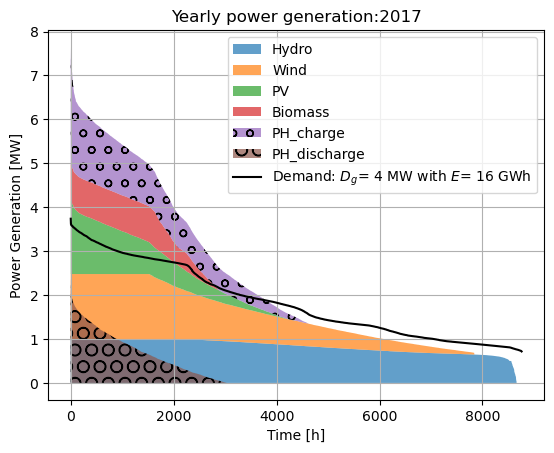

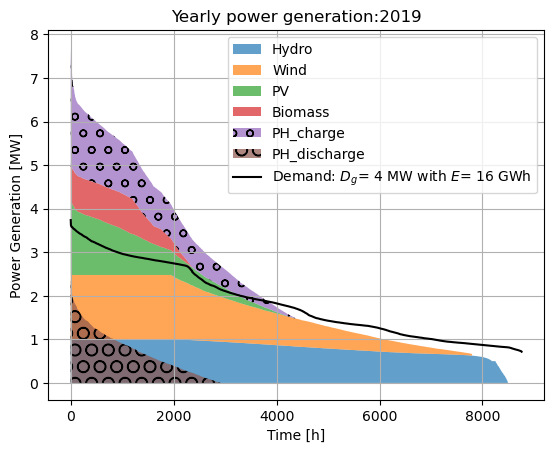

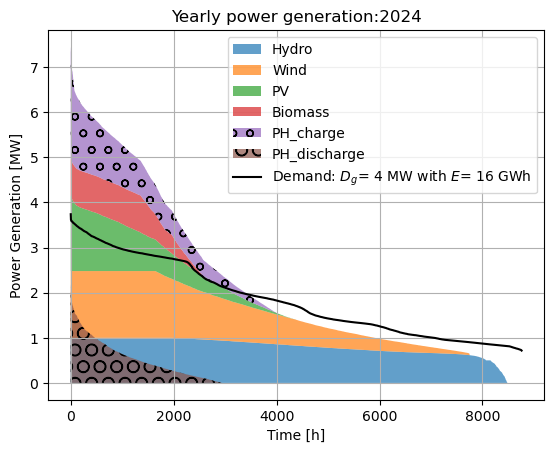

In [107]:
for scenario in Scen:
    plt.figure()
    generation_df = g.solution.to_dataframe().unstack(level=0)
    generation_df = generation_df.loc[scenario]
    generation_df.columns = generation_df.columns.droplevel(0)

    Demand_ld = pd.DataFrame(index=Time)
    Demand_ld['Demand'] =  demand["Demand"]
    Demand_ld['interval'] = 1
    Demand_ld = Demand_ld.sort_values(by=['Demand'], ascending = False)
    Demand_ld['duration'] = Demand_ld['interval'].cumsum()

    charge_df = sc.solution.to_dataframe()["solution"].unstack(level=0).loc[scenario]
    charge_df["Pumped_Hydro"] = sorted(charge_df["Pumped_Hydro"].values, reverse=True)
    discharge_df = sd.solution.to_dataframe()["solution"].unstack(level=0).loc[scenario]
    discharge_df["Pumped_Hydro"] = sorted(discharge_df["Pumped_Hydro"].values, reverse=True)
    
    total_production = generation_df.sum()
    sorted_columns = total_production.sort_values(ascending=False).index
    
    generation_df = generation_df[sorted_columns].apply(lambda x: x.sort_values(ascending=False).values, axis=0)
    bottom_stack = np.zeros(8760)
    for column in generation_df.columns:
        plt.fill_between(range(8760), bottom_stack, bottom_stack + generation_df[column], label=column, alpha=0.7)
        bottom_stack += generation_df[column]

    plt.fill_between(range(8760), bottom_stack, bottom_stack + charge_df["Pumped_Hydro"], label="PH_charge", alpha=0.7, hatch="o")

    plt.fill_between(range(8760), np.zeros(8760), discharge_df["Pumped_Hydro"], label="PH_discharge", alpha=0.7, hatch="O")
    plt.plot(Demand_ld['duration'], Demand_ld['Demand'], 'k-', label=r'Demand: $D_g$= %.0f MW with $E$= %.0f GWh' %(demand["Demand"].max(), demand["Demand"].sum()*1e-3))
    plt.xlabel("Time [h]")
    plt.ylabel("Power Generation [MW]")
    plt.title("Yearly power generation:" + scenario)
    plt.legend()
    plt.grid()
plt.show()

the Curtaillement is at a value of [303.63324255 737.32308546 897.24903469] MWh
the energy not served is at a value of [0.         0.         5.25220636] MWh
the CO2 emissions are at a value of [105.55829828  82.54932979  92.18632802] Tonnes
the installed capacity of Wind, PV, Hydro and Biomass are respectively at values of [1.47907594 1.84887856 1.         0.81754843] MW
the installed capacity of storage is at a value of [34.9529004  0.       ] MW
the price of electricity is at 109.9 euro per MWh


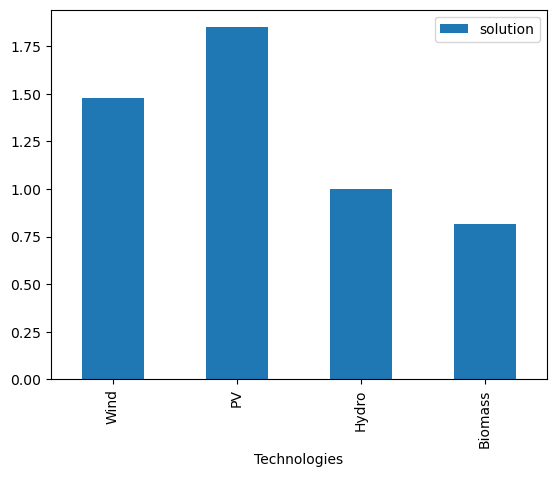

In [126]:
crt = curt.solution.sum(dim="Time").values
en = ens.solution.sum(dim="Time").values
co2e = co2_emissions.solution.values
ctech = cap_tech.solution.values #[1.69212937, 1.87492759, 1.00104827]
csto = cap_sto.solution.values #[26.32642663]
print(f'the Curtaillement is at a value of {crt} MWh')
print(f'the energy not served is at a value of {en} MWh')
print(f'the CO2 emissions are at a value of {co2e} Tonnes')
print(f'the installed capacity of Wind, PV, Hydro and Biomass are respectively at values of {ctech} MW')
print(f'the installed capacity of storage is at a value of {csto} MW')
m.objective
cap_tech.solution.to_dataframe().plot(kind="bar")
price_elec = total_cost.solution/DEMAND.sum()
print(f"the price of electricity is at {price_elec.values:.1f} euro per MWh")


# Sector Coupling

### Campus Topology and Thermal-Electrical Coupling

This section addresses the topology of the campus and the approach used to model sector coupling. Initially, the plan was to assign each building its own electrical, heating, and cooling loads. However, this was too complex for ThermoPython, which could not handle the model size.

As a result, we summed up electrical demands at the district level, and the thermal demands at the campus level as we are considering centralized cooling and heating system i.e., conversion from electricity to thermal energy occurs at a single location, the TFO. Because of this centralization, modeling thermal demands as either district-level or campus-wide aggregates leads to similar results. This simplification is justified, as the core interest in sector coupling lies not in spatial distribution but in accurately modeling the heat pump’s total energy ratio (TER), which reflects both heating and cooling efficiencies.

Maxime Haas, from the Montréal finality conversion team, provided hourly TER values for a full year. These TERs vary between 0 and 20 and significantly affect energy consumption depending on the hour. In the base case and uncertainty analysis, the TER was initially considered at his average (4.002).

However, we cannot directly integrate a formula for dynamic TER values because they are derived from simulations using EES and are not analytically expressible. Instead, Maxime provided all hourly TER values explicitly. At this point, the model essentially scales thermal loads to electrical ones using fixed coefficients—this does not represent real sector coupling and adds little analytical value. Therefore, we adopt a simplification.

---

### Simplification Strategy

We define three fixed TER values depending on the operating mode:

- `TER = 4` when only cooling is required  
- `TER = 3.5` when only heating is required  
- `TER = 8` when both heating and cooling are required simultaneously  

Example: If a timestep requires 10 MWh of cooling and 5 MWh of heating, then 5 MWh of each is supplied with `TER = 8`. The remaining 5 MWh of cooling is supplied with `TER = 4`. This is only valid if using both heating and cooling simultaneously is more efficient than handling them separately ( 8 > 3.5 + 4 ).

We also consider adding thermal storage to both heating and cooling loops. Three storage technologies are proposed: two for hot storage and one for cold. These systems are highly efficient, as they store thermal energy directly and are not affected by the electrical conversion efficiencies represented by TER.

The presence of thermal storage may affect the actual hourly conversion and hence modify the real-life TER. This is the reason why we cannot just apply the hourly TER while considering thermal batteries.

---

### Modeling Approach

Due to constraints (including Maxime’s limited availability for further simulation), we adopt two scenarios:

1. **Hourly TER without thermal storage** – using Maxime’s provided TER values directly -> just a variant of the base case 
2. **Fixed COP with thermal storage** – assuming the simplification described above.

In the first case, thermal loads are just considered as a TFO load with the TER for each hour. It was not possible to do it considering a sector coupling approach as it results in a  error "OSError: [Errno 28] No space left on device".




### Size problem 
Using the model as in the other sections and runing it leaded to error due to space available on the device ( space limit put by thermopython as it must run for everyone that use it at the university. ) 
To solve this problem, we had to diminish the size of the LP formulation of the model. To do so, some varaibles where removed ( fcd for example which only appear as g * MARGINALFUELCOST which appears only in the objective fundtion -> the product directly in the objective. Same thing for inj and curt.)
Even with those changes, the model was still too big, so we had to remove the batteries storage to remove some complexity. It finally managed to solve. 
PS : Batteries were not used in the base case anyway.

After these cahnges, the device was able to load, but the day after, it did not for the same reason, without any modification.. The error is "OSError: [Errno 28] No space left on device" and is due to constraints and variables of too high dimensionality that need to be reduced. We therefore need to take another approach for the sector coupling, and we will consider the heat pump as a virtual power plant that needs to account for a certain demand and if possible we will consider storage in the ceratin demand.

## Hourly TER case

### Loading data for first case

In [147]:
tech_param             = pd.read_csv('Data/technologies.csv',index_col=0)                                        # technologies
sto_param              = pd.read_csv("Data/sector/TER/storage_technologies.csv", index_col=0).to_xarray()        # storage technologies
demand                 = pd.read_csv('Data/sector/TER/hourly_demands_TER.csv',index_col=0) *1e-3                            #demand
conv_tech_param        = pd.read_csv('Data/sector/TER/conversion_technologies.csv', index_col =0).to_xarray()    # Links
cap_max                = pd.read_csv('Data/sector/TER/max_tech_capacity.csv',index_col=0)                        # maximum capacities of technologies
general_parameters     = pd.read_csv('Data/sector/global_parameters.csv',index_col=0)                            # Global parameters
linecapacities         = pd.read_csv('Data/sector/lines_capacity.csv', index_col = 0).to_xarray()                # Line capacities
A                      = pd.read_csv('Data/sector/TER/incidence_matrix.csv',index_col=0).fillna(0)               # incidence matrix
AF                     = pd.read_csv('Data/sector/AF.csv',index_col=0)                                           # AF is given in the file only for the renewables, we need to add columns for the other technologies.
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
AF['Hydro'] = AF_hydro.values
AF['Hydro'] = AF['Hydro'].where(AF['Hydro'] < 1, 1)                                                              # adding hydro Af to AF
AF['Wind'] = AF_Ren.values                                                                                       # using the corrected AF for Wind
for tech in tech_param.index:
    if tech not in AF.columns:
        AF.loc[:,tech] = tech_param.loc[tech, "Availability"] 
tech_param = tech_param.to_xarray()
TER    = pd.read_csv("Data/sector/TER/TER.csv", index_col=0)
TER = TER.where(TER > 1, 1).squeeze()

### Sets and parameters

In [148]:
### Sets
Time = demand.index
Tech = tech_param.get_index("Technologies")
Sto = sto_param.get_index("Storages")
Nodes = A.T.index.rename("Nodes")        # Nodes of your graph.
Links = A.index                          # Chords of your graph.
ConvTechs = A.loc[["T1"]].index       # Subset of the set Links representing the converstion technologies
Lines = A.loc["E1":"E4"].index         # Subset of the set Links representing the electrical lines or gas pipelines

# Technologies related
MARGINAL_FUEL_COST = tech_param['Fuel costs']/tech_param['Rated efficiency']
CO2_INTENSITY = tech_param['Fuel CO2 content']/tech_param['Rated efficiency']
tech_phi = tech_param["Discount rate"]/(1-(1+tech_param["Discount rate"])**(-tech_param["Lifetime"]))
TECH_IC = tech_phi*tech_param['Investment cost']
DELTA_MAX_UP = tech_param['Ramp-up rate']
DELTA_MAX_DOWN = tech_param['Ramp-down rate']
AF = AF[Tech]
AF  = xr.DataArray(AF,coords=[Time,Tech])
cap_max_sto = cap_max.reindex(Sto)
cap_max = cap_max.reindex(Tech)
STO_MAX_CAP = xr.DataArray(cap_max_sto,coords=[Sto,Nodes])
TECH_MAX_CAP = xr.DataArray(cap_max,coords=[Tech,Nodes])

# Storage related

sto_phi = sto_param["Discount rate"]/(1-(1+sto_param["Discount rate"])**(-sto_param["Lifetime"]))
STO_IC = sto_phi*sto_param["Investment cost"]
EFF_D = sto_param["Discharge efficiency"]
EFF_C = sto_param["Charge efficiency"]
SOC_MAX = sto_param["Maximum state of charge"]
SOC_MIN = sto_param["Minimum state of charge"]
STO_dT = sto_param["Storage duration"]

# Links Related
CAPACITY = linecapacities["Capacity"]
conv_tech_phi = conv_tech_param['Discount rate']/(1-(1+conv_tech_param['Discount rate'])**(-conv_tech_param['Lifetime']))
CONV_TECH_IC = conv_tech_phi*conv_tech_param['Investment cost']
CONV_TECH_MAX_CAP = conv_tech_param['Maximum capacity']

# Configuration and scenario parameters
A = xr.DataArray(A, coords=[Links, Nodes])
DEMAND = xr.DataArray(demand,coords=[Time,Nodes])
TS = float(general_parameters.Value.loc['Time step'])
VOLL = float(general_parameters.Value.loc['VOLL'])
CO2_PRICE = float(general_parameters.Value.loc['CO2_price'])
CO2_BOUND = float(general_parameters.Value.loc['CO2_bound'])


EFF = xr.DataArray(1.0, coords=[Links, Time], name="EFF")
EFF.loc["T1"] = xr.DataArray(TER, coords=[Time])

### Optimization Model

In [149]:
### Create the model instance

m = Model()

### Create the variables

cap_tech   = m.add_variables(lower = 0, coords = [Tech, Nodes], name = 'cap_tech') # Installed capacity of the technologies [MW]
g          = m.add_variables(lower = 0, coords = [Tech, Nodes, Time], name = 'g')        # Generated power [MW]
fcd        = m.add_variables(lower = 0, coords = [Tech, Nodes, Time], name = 'fcd')    # Fuel cost definition [EUR/h]

cap_sto    = m.add_variables(lower = 0, coords = [Sto, Nodes], name = 'cap_sto') # Installed capacity of the storages [MW]
sd         = m.add_variables(lower = 0, coords = [Sto, Nodes, Time], name = 'sd')     # Storage discharge [MW]
sc         = m.add_variables(lower = 0, coords = [Sto, Nodes, Time], name = 'sc')     # Storage charge [MW]
se         = m.add_variables(lower = 0, coords = [Sto, Nodes, Time], name = 'se')     # Stored energy [MWh]

co2_emissions   =  m.add_variables(lower = 0, name = 'co2_emissions')     # Combined CO2 emissions [tCO2eq]
ens             = m.add_variables(lower = 0, coords = [Nodes, Time], name = 'ens')           # Energy no served [MWh]
curt            = m.add_variables(lower = 0, coords = [Nodes, Time])          # Curtailment [MWh]

### Variables for powerflow (curt, ens, flow, inj)
flow          = m.add_variables(coords= [Links, Time], name = 'flow')                 # Flows in the lines [MWh]
inj           = m.add_variables(coords= [Nodes, Time], name = 'inj')                    # Injection at node n [MWh]

cap_conv_tech = m.add_variables(lower = 0, coords = [ConvTechs], name = "cap_conv_tech") 

# Create the constraints

# Technology sizing
cap_max_tech = m.add_constraints(cap_tech <= TECH_MAX_CAP, name = "cap_max_tech")
power_max    = m.add_constraints(g <= AF*cap_tech, name= 'power_max')

# Ramping up/down constraints
power_rampup_initial = m.add_constraints(g.loc[:,:,:Time[0]] - g.loc[:,:,Time[len(Time)-1]:] <= DELTA_MAX_UP*cap_tech , name = 'power_rampup_initial')
power_rampup         = m.add_constraints(g.loc[:,:,Time[1:]] <= g.shift(Time = 1) + DELTA_MAX_UP*cap_tech, name = 'power_rampup')

power_rampdown_initial = m.add_constraints(g.loc[:,:,:Time[0]] - g.loc[:,:,Time[len(Time)-1]:]  >= - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown_initial')
power_rampdown         = m.add_constraints(g.loc[:,:,Time[1:]]>= g.shift(Time = 1) - DELTA_MAX_DOWN*cap_tech, name = 'power_rampdown')


# Storage sizing + Initial condition
cap_max_sto           = m.add_constraints(cap_sto <= STO_MAX_CAP, name = "cap_max_sto")
storage_initial_state = m.add_constraints(se.loc[:,:,:Time[0]] - se.loc[:,:,Time[len(Time)-1]:]  == TS*EFF_C*sc.loc[:,:,Time[len(Time)-1]:] - TS*sd.loc[:,:,Time[len(Time)-1]:]/EFF_D, name = 'storage_initial_state')
storage_balance       = m.add_constraints(se.loc[:,:,Time[1:]] - se.shift(Time = 1) == TS*EFF_C*sc.loc[:,:,Time[1:]] -TS*sd.loc[:,:,Time[1:]]/EFF_D, name = 'storage_balance')
storage_charge_max    = m.add_constraints(sc <= cap_sto/STO_dT, name = 'storage_charge_max')
storage_discharge_max = m.add_constraints(sd <= cap_sto/STO_dT, name = 'storage_discharge_max')
storage_energy_max    = m.add_constraints(se <= SOC_MAX*cap_sto, name = 'storage_energy_max' )
storage_energy_min    = m.add_constraints(se >= SOC_MIN*cap_sto, name = 'storage_energy_min' )
# Link sizing
cap_conv_tech_max     = m.add_constraints(cap_conv_tech <= CONV_TECH_MAX_CAP, name = "conv_tech_max_cap")

# Power Flow constrains
max_line_capacity     = m.add_constraints(flow.loc[Lines] <= CAPACITY, name="max_line_capacity")
min_line_capacity     = m.add_constraints(flow.loc[Lines] >= -CAPACITY, name="min_line_capacity")

links_max             = m.add_constraints(flow.loc[ConvTechs] <= cap_conv_tech, name="max_flow_conv_tech")
links_min             = m.add_constraints(flow.loc[ConvTechs] >= 0, name="min_flow_conv_tech")

power_flow     = m.add_constraints(inj == (A.T*flow*EFF).sum(dim="Links"), name = "power_flow")
power_balance  = m.add_constraints((A.loc[Lines,:].T*flow.loc[Lines,:]).sum(dims=["Links", "Nodes"]) == 0, name = "power_balance")

# Market clearing
mcc            = m.add_constraints(g.sum(dims = 'Technologies') + ens + (sd - sc).sum(dims = "Storages") -inj == DEMAND, name = 'mcc')

# Limit on energy not served
ens_lim        = m.add_constraints(ens<=DEMAND, name = 'ens_lim')

# Costs
fuel_cost      = m.add_constraints(fcd == MARGINAL_FUEL_COST*g, name="fuel_cost")

# CO2 Emissions
# co2_account =  m.add_constraints(co2_emissions == (CO2_INTENSITY*g).sum(dims=["Technologies", "Time"]), name="co2 account")
# co2_bound = m.add_constraints(co2_emissions <= CO2_BOUND, name = "co2_bound")

### Curtailment evaluation.
RE_MASK        = xr.DataArray(np.array([1,1,1,0]), coords = [Tech])
curt_eval      = m.add_constraints(curt == ((AF*cap_tech-g)*RE_MASK).sum(dims = 'Technologies') , name = 'curt')

# Add the objective function
total_cost = ((TECH_IC*cap_tech).sum(dims=["Technologies", "Nodes"]) 
            + (CONV_TECH_IC*cap_conv_tech.sum(dims="Links")
            + (STO_IC*cap_sto).sum(dims=["Storages", "Nodes"]) 
            + (TS*fcd).sum(dims=["Technologies", "Nodes", "Time"]) 
            + (VOLL*TS*ens).sum(dims=["Nodes", "Time"])))
m.add_objective(total_cost)

### Solve

In [150]:
#m.solve("gurobi")
m.solve("highs")

Writing continuous variables.: 100%|██████████| 13/13 [00:00<00:00, 13.80it/s]


Running HiGHS 1.10.0 (git hash: fd86653): Copyright (c) 2025 HiGHS under MIT licence terms
LP   linopy-problem-gbwquy5y has 1410439 rows; 779672 cols; 3589135 nonzeros
Coefficient ranges:
  Matrix [1e-03, 2e+02]
  Cost   [1e+00, 1e+07]
  Bound  [0e+00, 0e+00]
  RHS    [1e-01, 2e+04]
Presolving model
260144 rows, 183137 cols, 749012 nonzeros  1s
228701 rows, 138592 cols, 698118 nonzeros  2s
Dependent equations search running on 56245 equations with time limit of 1000.00s
Dependent equations search removed 0 rows and 0 nonzeros in 0.00s (limit = 1000.00s)
228701 rows, 138592 cols, 698118 nonzeros  3s
Presolve : Reductions: rows 228701(-1181738); columns 138592(-641080); elements 698118(-2891017)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Ph1: 0(0) 3s
      24046    -1.5949060693e+07 Pr: 36654(15768.5); Du: 0(3.97704e-07) 9s
      34469    -1.5662816186e+07 Pr: 33464(13778.4); D

('ok', 'optimal')

### Data Process

In [151]:
cap_tech.solution.to_dataframe()

solution
Technologies Nodes              
Wind         TFO        1.216433
             Dupere    -0.000000
             Overdale  -0.000000
             Hochelaga -0.000000
             Anjou     -0.000000
             THERMAL    0.000000
PV           TFO       -0.000000
             Dupere     0.614865
             Overdale  -0.000000
             Hochelaga -0.000000
             Anjou     -0.000000
             THERMAL    0.000000
Hydro        TFO        1.000000
             Dupere    -0.000000
             Overdale  -0.000000
             Hochelaga -0.000000
             Anjou     -0.000000
             THERMAL    0.000000
Biomass      TFO        0.719608
             Dupere    -0.000000
             Overdale  -0.000000
             Hochelaga -0.000000
             Anjou     -0.000000
             THERMAL    0.000000

In [152]:
cap_sto.solution

<xarray.DataArray 'solution' (Storages: 1, Nodes: 6)> Size: 48B
array([[35.7552547, -0.       , -0.       , -0.       , -0.       ,
        -0.       ]])
Coordinates:
  * Storages  (Storages) object 8B 'Pumped_Hydro'
  * Nodes     (Nodes) object 48B 'TFO' 'Dupere' 'Overdale' ... 'Anjou' 'THERMAL'

In [153]:
print("‣ Links in the solved flow variable:", flow.solution.coords["Links"].values)

if "T1" not in flow.solution.coords["Links"].values:
    raise ValueError("Link name 'THERMAL' not found in flow.solution. "
                     "Did you keep HPH/HPC in the incidence matrix?")

# Turn the xarray into a pandas Series so we can inspect numbers
thermal_in = flow.solution.sel(Links="T1").to_series()

print("‣ THERMAL electrical input – basic stats")
print(thermal_in.describe())

print("‣ TER series – basic stats")
print(TER.describe())


‣ Links in the solved flow variable: ['E1' 'E2' 'E3' 'E4' 'T1']
‣ THERMAL electrical input – basic stats
count    8760.000000
mean        0.121091
std         0.157868
min         0.009152
25%         0.024952
50%         0.053251
75%         0.121389
max         0.706000
Name: solution, dtype: float64
‣ TER series – basic stats
count    8760.000000
mean        4.054778
std         2.906734
min         1.000000
25%         1.909000
50%         3.351000
75%         5.292500
max        20.560000
Name: TER, dtype: float64


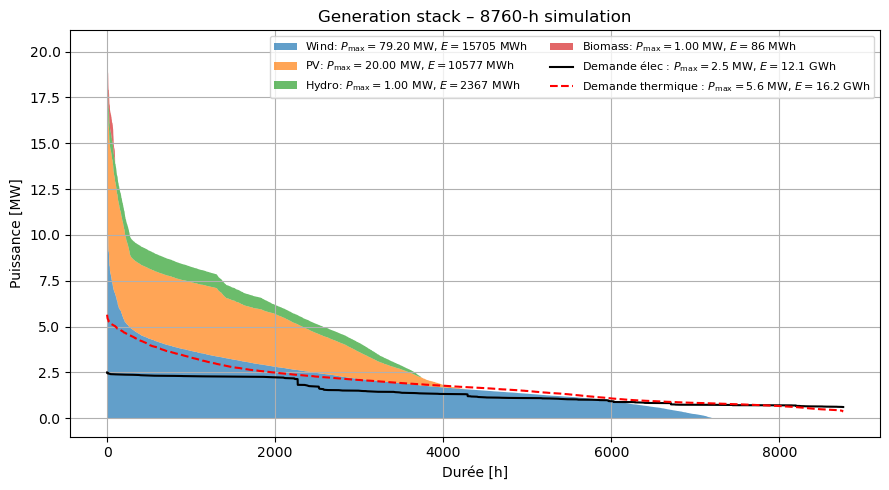

In [146]:
# ------------------------------------------------------------------
# 0.  Horizon & séries de demande
# ------------------------------------------------------------------
H   = len(Time)
rng = range(H)

if "THERMAL" in demand.columns:
    # Demande thermique = colonne "Thermal"
    demand_th = demand["THERMAL"].iloc[:H]

    # Demande électrique = toutes les autres colonnes
    elec_cols  = [c for c in demand.columns if c != "THERMAL"]
    demand_el  = demand[elec_cols].sum(axis=1).iloc[:H]
else:
    # Cas ancien : pas de colonne Thermal
    demand_th = pd.Series(np.zeros(H), index=Time[:H])
    if "Demand" in demand.columns:
        demand_el = demand["Demand"].iloc[:H]
    else:                     # somme brute de tous les nœuds
        demand_el = demand.sum(axis=1).iloc[:H]

# ------------------------------------------------------------------
# 1.  Production agrégée (Time × Tech)           ─ identique
# ------------------------------------------------------------------
gen_da = g.solution.sum(dim="Nodes").transpose("Time", "Technologies")
gen_df = gen_da.to_pandas().iloc[:H]

# ------------------------------------------------------------------
# 2.  Tri des technologies par production annuelle
# ------------------------------------------------------------------
sorted_cols = gen_df.sum().sort_values(ascending=False).index
gen_df = gen_df[sorted_cols]

# ------------------------------------------------------------------
# 3.  Durée‐courbes par technologie
# ------------------------------------------------------------------
dur_curves = {tech: np.sort(gen_df[tech].values)[::-1] for tech in gen_df.columns}

# ------------------------------------------------------------------
# 4.  Stack plot + deux courbes de demande
# ------------------------------------------------------------------
bottom = np.zeros(H)
plt.figure(figsize=(9, 5))

for tech, curve in dur_curves.items():
    plt.fill_between(rng,
                     bottom,
                     bottom + curve,
                     alpha=0.7,
                     label=(r"%s: $P_\mathrm{max}=%.2f$ MW, "
                            r"$E=%.0f$ MWh"
                            % (tech,
                               float(cap_tech.solution.sel(Technologies=tech).sum()),
                               float(g.solution.sel(Technologies=tech).sum()))))
    bottom += curve

# ⇩ Courbe demande électrique
plt.plot(rng,
         np.sort(demand_el.values)[::-1],
         "k-",
         label=r"Demande élec : $P_\mathrm{max}=%.1f$ MW, "
               r"$E=%.1f$ GWh"
               % (demand_el.max(), demand_el.sum()/1e3))

# ⇩ Courbe demande thermique
plt.plot(rng,
         np.sort(demand_th.values)[::-1],
         "r--",
         label=r"Demande thermique : $P_\mathrm{max}=%.1f$ MW, "
               r"$E=%.1f$ GWh"
               % (demand_th.max(), demand_th.sum()/1e3))

plt.xlabel("Durée [h]")
plt.ylabel("Puissance [MW]")
plt.title(f"Generation stack – {H}-h simulation")
plt.grid(True)
plt.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.show()


## Thermal Storage

In [171]:
# ---------------------------------------------------------------------
# 1. Load data
# ---------------------------------------------------------------------
tech_param      = pd.read_csv("Data/technologies.csv", index_col=0)
sto_param       = pd.read_csv("Data/sector/thermal_storage/storage_technologies.csv", index_col=0).to_xarray()
demand          = (pd.read_csv("Data/sector/thermal_storage/demands.csv", index_col=0) * 1e-3)      # [MWh]
conv_tech_param = pd.read_csv("Data/sector/thermal_storage/conversion_technologies.csv", index_col=0).to_xarray()
cap_max         = pd.read_csv("Data/sector/thermal_storage/max_tech_capacity.csv", index_col=0)
general_param   = pd.read_csv("Data/sector/global_parameters.csv", index_col=0)
linecapacities  = pd.read_csv("Data/sector/lines_capacity.csv", index_col=0).to_xarray()
Incidence       = pd.read_csv("Data/sector/thermal_storage/incidence_matrix.csv", index_col=0).fillna(0)
AF              = pd.read_csv('Data/sector/AF.csv',index_col=0)                                                       # AF is given in the file only for the renewables, we need to add columns for the other technologies.
df_debit = pd.read_csv('Data/dbit-hourly-pred-fullindex.csv',parse_dates=True,index_col=0)
Q_devie   = df_debit['Flow_pred'] * 0.01           # 1 % du débit total
AF_hydro  = debit_to_AF(Q_devie)
AF['Hydro'] = AF_hydro.values
AF['Hydro'] = AF['Hydro'].where(AF['Hydro'] < 1, 1)                                                                          # adding hydro Af to AF
AF['Wind'] = AF_Ren.values                                                                                                   # using the corrected AF for Wind
for tech in tech_param.index:
    if tech not in AF.columns:
        AF.loc[:,tech] = tech_param.loc[tech, "Availability"] 
tech_param = tech_param.to_xarray()

In [172]:
# ---------------------------------------------------------------------
#  1.  SETS
# ---------------------------------------------------------------------
Time  = demand.index
Tech  = tech_param.get_index("Technologies")
Sto   = sto_param.get_index("Storages")
Nodes = Incidence.T.index.rename("Nodes")
Links = Incidence.index
ConvTechs = Incidence.loc[["HP"]].index         # the heat-pump is link “T1”
Lines     = Incidence.loc["E1":"E4"].index

ELEC_NODE = ["TFO","Dupere","Overdale","Hochelaga","Anjou"]
HEAT_NODE = "Hot"
COOL_NODE = "Cold"

# ---------------------------------------------------------------------
#  2.  PARAMETERS
# ---------------------------------------------------------------------
# -- technology drivers ------------------------------------------------
MARGINAL_FUEL_COST = tech_param["Fuel costs"] / tech_param["Rated efficiency"]
CO2_INTENSITY      = tech_param["Fuel CO2 content"] / tech_param["Rated efficiency"]
phi_tech           = tech_param["Discount rate"] / (1 - (1 + tech_param["Discount rate"]) ** (-tech_param["Lifetime"]))
TECH_IC            = phi_tech * tech_param["Investment cost"]
DELTA_MAX_UP       = tech_param["Ramp-up rate"]
DELTA_MAX_DOWN     = tech_param["Ramp-down rate"]

# -- availability factor matrix (pad missing technologies) -------------
for t in tech_param.get_index("Technologies"):
    if t not in AF.columns:
        AF[t] = tech_param.sel(Technologies=t)["Availability"].item()
AF = xr.DataArray(AF[Tech], coords=[Time, Tech])

# -- storage -----------------------------------------------------------
phi_sto  = sto_param["Discount rate"] / (1 - (1 + sto_param["Discount rate"]) ** (-sto_param["Lifetime"]))
STO_IC   = phi_sto * sto_param["Investment cost"]
EFF_D    = sto_param["Discharge efficiency"]
EFF_C    = sto_param["Charge efficiency"]
SOC_MAX  = sto_param["Maximum state of charge"]
SOC_MIN  = sto_param["Minimum state of charge"]
STO_dT   = sto_param["Storage duration"]

# -- max capacities ----------------------------------------------------
STO_MAX_CAP  = xr.DataArray(cap_max.reindex(Sto),  coords=[Sto, Nodes])
TECH_MAX_CAP = xr.DataArray(cap_max.reindex(Tech), coords=[Tech, Nodes])

# -- links & lines -----------------------------------------------------
CAPACITY          = linecapacities["Capacity"]
phi_conv          = conv_tech_param["Discount rate"] / (1 - (1 + conv_tech_param["Discount rate"]) ** (-conv_tech_param["Lifetime"]))
CONV_TECH_IC      = phi_conv * conv_tech_param["Investment cost"]
CONV_TECH_MAX_CAP = conv_tech_param["Maximum capacity"]

# -- miscellaneous -----------------------------------------------------
TS         = float(general_param.Value.loc["Time step"])
VOLL       = float(general_param.Value.loc["VOLL"])
CO2_PRICE  = float(general_param.Value.loc["CO2_price"])
CO2_BOUND  = float(general_param.Value.loc["CO2_bound"])


In [173]:
STO_MAX_CAP

<xarray.DataArray (Storages: 5, Nodes: 7)> Size: 280B
array([[ 58,   0,   0,   0,   0,   0,   0],
       [ 10,  10,  10,  10,  10,   0,   0],
       [  0,   0,   0,   0,   0,  20,   0],
       [  0,   0,   0,   0,   0, 100,   0],
       [  0,   0,   0,   0,   0,   0,  15]])
Coordinates:
  * Storages  (Storages) object 40B 'Pumped_Hydro' ... 'Chilled_Water_Storage'
  * Nodes     (Nodes) object 56B 'TFO' 'Dupere' 'Overdale' ... 'Hot' 'Cold'

In [183]:
m = Model()

# ----- 3.1  Core variables ------------------------------------------------
cap_tech = m.add_variables(lower=0, coords=[Tech, Nodes], name="cap_tech")
g        = m.add_variables(lower=0, coords=[Tech, Nodes, Time], name="g")
fcd      = m.add_variables(lower=0, coords=[Tech, Nodes, Time], name="fcd")

cap_sto = m.add_variables(lower=0, coords=[Sto, Nodes], name="cap_sto")
sd      = m.add_variables(lower=0, coords=[Sto, Nodes, Time], name="sd")
sc      = m.add_variables(lower=0, coords=[Sto, Nodes, Time], name="sc")
se      = m.add_variables(lower=0, coords=[Sto, Nodes, Time], name="se")

co2_emissions = m.add_variables(lower=0, name="co2_emissions")
ens           = m.add_variables(lower=0, coords=[Nodes, Time], name="ens")
curt          = m.add_variables(lower=0, coords=[Nodes, Time], name="curt")

flow     = m.add_variables(coords=[Links, Time], name="flow")
inj      = m.add_variables(coords=[Nodes, Time], name="inj")

cap_conv_tech = m.add_variables(lower=0, coords=[ConvTechs], name="cap_conv_tech")

# ----- 3.2  *****  NEW HEAT-PUMP STREAMS  ***** -----------------------
hp_e_heat = m.add_variables(lower=0, coords=[Time], name="hp_e_heat")   # el in (heat only)
hp_e_cool = m.add_variables(lower=0, coords=[Time], name="hp_e_cool")   # el in (cool only)
hp_e_sim  = m.add_variables(lower=0, coords=[Time], name="hp_e_sim")    # el in (H + C)

hp_q_heat = m.add_variables(lower=0, coords=[Time], name="hp_q_heat")   # useful heat
hp_q_cool = m.add_variables(lower=0, coords=[Time], name="hp_q_cool")   # useful cool

# ----- 3.3  Constraints ---------------------------------------------------
# — sizing and dispatch of normal techs ------------------------------------
cap_max_tech      = m.add_constraints(cap_tech <= TECH_MAX_CAP, name="cap_max_tech")
power_max         = m.add_constraints(g <= AF * cap_tech, name="power_max")

power_rampup_initial          = m.add_constraints(g.loc[:, :, Time[0]] - g.loc[:, :, Time[-1]:] <= DELTA_MAX_UP * cap_tech, name="power_rampup_initial")
power_rampup                  = m.add_constraints(g.loc[:, :, Time[1:]] <= g.shift(Time=1) + DELTA_MAX_UP * cap_tech, name="power_rampup")

power_rampdown_initial        = m.add_constraints(g.loc[:, :, Time[0]] - g.loc[:, :, Time[-1]:] >= -DELTA_MAX_DOWN * cap_tech, name="power_rampdown_initial")
power_rampdown                = m.add_constraints(g.loc[:, :, Time[1:]] >= g.shift(Time=1) - DELTA_MAX_DOWN * cap_tech, name="power_rampdown")

# — storage ---------------------------------------------------------------
cap_max_sto                   = m.add_constraints(cap_sto <= STO_MAX_CAP, name="cap_max_sto")
storage_initial_state         = m.add_constraints(se.loc[:, :, Time[0]] - se.loc[:, :, Time[-1]:] == TS * EFF_C * sc.loc[:, :, Time[-1]:] - TS * sd.loc[:, :, Time[-1]:] / EFF_D, name="storage_initial_state")
storage_balance               = m.add_constraints(se.loc[:, :, Time[1:]] - se.shift(Time=1) == TS * EFF_C * sc.loc[:, :, Time[1:]] - TS * sd.loc[:, :, Time[1:]] / EFF_D, name="storage_balance")
storage_charge_max            = m.add_constraints(sc <= cap_sto / STO_dT, name="storage_charge_max")
storage_discharge_max         = m.add_constraints(sd <= cap_sto / STO_dT, name="storage_discharge_max")
storage_energy_max            = m.add_constraints(se <= SOC_MAX * cap_sto, name="storage_energy_max")
storage_energy_min            = m.add_constraints(se >= SOC_MIN * cap_sto, name="storage_energy_min")

# — conversion link (heat pump) -------------------------------------------
conv_tech_max_cap             = m.add_constraints(cap_conv_tech <= CONV_TECH_MAX_CAP, name="conv_tech_max_cap")
max_flow_conv_tech            = m.add_constraints(flow.loc[ConvTechs] <= cap_conv_tech, name="max_flow_conv_tech")
min_flow_conv_tech            = m.add_constraints(flow.loc[ConvTechs] >= 0, name="min_flow_conv_tech")

# ***** NEW: limit the sum of the three electrical streams to the HP cap **
hp_cap_limit                  = m.add_constraints(hp_e_heat + hp_e_cool + hp_e_sim <= cap_conv_tech.loc["HP"], name="hp_cap_limit")

# ***** NEW: performance relationships ************************************
hp_heat_output                = m.add_constraints(hp_q_heat == 3.5 * hp_e_heat + 4 * hp_e_sim, name="hp_heat_output")
hp_cool_output                = m.add_constraints(hp_q_cool == 4.0 * hp_e_cool + 4 * hp_e_sim, name="hp_cool_output")

# — lines capacity --------------------------------------------------------
max_line_capacity             = m.add_constraints(flow.loc[Lines] <= CAPACITY,  name="max_line_capacity")
min_line_capacity             = m.add_constraints(flow.loc[Lines] >= -CAPACITY, name="min_line_capacity")

# — nodal injections ------------------------------------------------------
A = xr.DataArray(Incidence, coords=[Links, Nodes])
EFF = xr.DataArray(1.0, coords=[Links, Time])        # all physical links lossless

power_flow          = m.add_constraints(inj == (A.T * flow * EFF).sum(dim="Links"), name="power_flow")
power_balance       = m.add_constraints((A.loc[Lines, :] * flow.loc[Lines, :]).sum(dims=["Links", "Nodes"]) == 0, name="power_balance")

# ***** NEW: inject HP electricity & useful energy into the nodes *********
# Electricity *consumed* – negative injection
hp_elec_balance    = m.add_constraints(inj.loc[ELEC_NODE] == inj.loc[ELEC_NODE] - (hp_e_heat + hp_e_cool + hp_e_sim), name="hp_elec_balance")

# Useful heat / cool – positive injection
hp_heat_balance    = m.add_constraints(inj.loc[HEAT_NODE] == inj.loc[HEAT_NODE] + hp_q_heat, name="hp_heat_balance")
hp_cool_balance    = m.add_constraints(inj.loc[COOL_NODE] == inj.loc[COOL_NODE] + hp_q_cool, name="hp_cool_balance")

# — market clearing (electrical node) -------------------------------------
DEMAND              = xr.DataArray(demand, coords=[Time, Nodes])
market_clearing     = m.add_constraints(g.sum(dim="Technologies") + ens + (sd - sc).sum(dim="Storages") - inj == DEMAND, name="market_clearing")

ens_limit    = m.add_constraints(ens <= DEMAND, name="ens_limit")

# — costs -----------------------------------------------------------------
fuel_cost    = m.add_constraints(fcd == MARGINAL_FUEL_COST * g, name="fuel_cost")

# — curtailment evaluation (renewables mask) ------------------------------
RE_MASK = xr.DataArray(np.array([1, 1, 1, 0]), coords=[Tech])
curt    = m.add_constraints(curt == ((AF * cap_tech - g) * RE_MASK).sum(dim="Technologies"), name="curt")

# CO2 Emissions
co2_account =  m.add_constraints(co2_emissions == (CO2_INTENSITY*g).sum(dims=["Technologies", "Nodes", "Time"]), name="co2 account")
co2_bound = m.add_constraints(co2_emissions <= CO2_BOUND, name = "co2_bound")

# ---------------------------------------------------------------------
#  4.  OBJECTIVE
# ---------------------------------------------------------------------
total_cost = (
      (TECH_IC * cap_tech).sum(dims=["Technologies", "Nodes"])
    + (CONV_TECH_IC * cap_conv_tech).sum(dim="Links")
    + (STO_IC * cap_sto).sum(dims=["Storages", "Nodes"])
    + (VOLL * TS * ens).sum(dims=["Nodes", "Time"])
    + (co2_emissions * 50)
)

m.add_objective(total_cost)

In [184]:
# ---------------------------------------------------------------------
# 7. Solve – write files to a roomy folder
# ---------------------------------------------------------------------
sol = m.solve('gurobi')

Writing continuous variables.: 100%|██████████| 18/18 [00:01<00:00,  9.10it/s]


Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2551043
Academic license 2551043 - for non-commercial use only - registered to p.___@uliege.be
Read LP format model from file /tmp/linopy-problem-ebfirvnx.lp
Reading time = 4.01 seconds
obj: 2943482 rows, 1681985 columns, 7897214 nonzeros
Gurobi Optimizer version 12.0.0 build v12.0.0rc1 (linux64 - "Ubuntu 22.04.5 LTS")

CPU model: Intel(R) Xeon(R) Gold 6354 CPU @ 3.00GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Academic license 2551043 - for non-commercial use only - registered to p.___@uliege.be
Optimize a model with 2943482 rows, 1681985 columns and 7897214 nonzeros
Model fingerprint: 0x159b3785
Coefficient statistics:
  Matrix range     [1e-03, 4e+01]
  Objective range  [5e+01, 1e+07]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-08, 3e+08]
Presolve removed 2421577 rows and 1369271 columns
Presolve time: 3.66s
Presolved

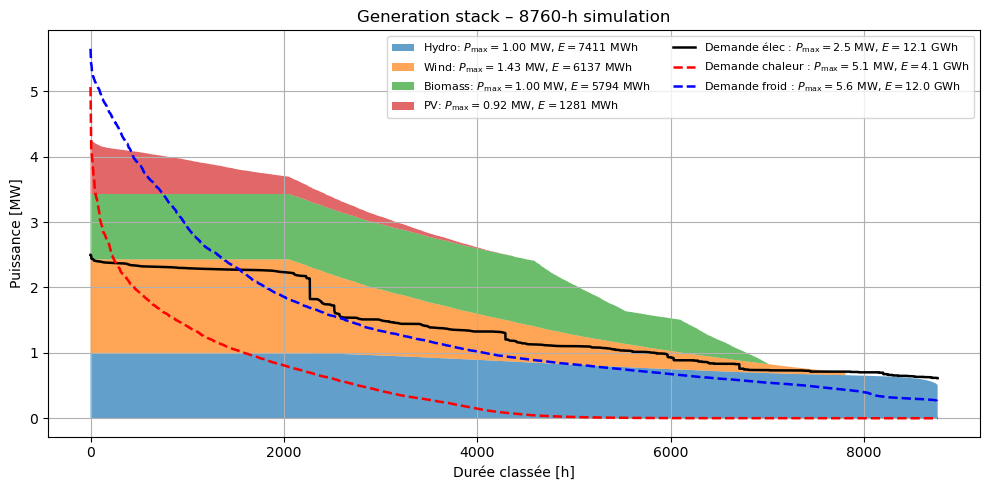

In [185]:
# ================================================================
# 0.  Réglages et utilitaires
# ================================================================
H   = len(Time)
rng = range(H)

# identifie les noms réels
hot_col  = "Heat"
cold_col = "Cold"

# ---------------------------------------------------------------
# 1.  Construire les trois séries de demande
# ---------------------------------------------------------------
d_hot  = demand[hot_col ].iloc[:H]
d_cold = demand[cold_col].iloc[:H]
d_ele  = demand.drop(columns=[hot_col, cold_col], errors="ignore").sum(axis=1).iloc[:H]

# ---------------------------------------------------------------
# 2.  Production agrégée par techno  (Time × Tech)
# ---------------------------------------------------------------
gen_da = g.solution.sum(dim="Nodes").transpose("Time", "Technologies")
gen_df = gen_da.to_pandas().iloc[:H]

# ordre décroissant d’énergie annuelle
gen_df = gen_df[gen_df.sum().sort_values(ascending=False).index]

# ---------------------------------------------------------------
# 3.  Courbes de durée par techno (longueur H)
# ---------------------------------------------------------------
curves = {tech: np.sort(gen_df[tech].values)[::-1] for tech in gen_df.columns}

# ---------------------------------------------------------------
# 4.  Tracé empilé + trois courbes de demande
# ---------------------------------------------------------------
plt.figure(figsize=(10, 5))
bottom = np.zeros(H)

for tech, curve in curves.items():
    # capacité installée : cas particulier pour les trois modes HP
    if tech in HP_MODES:
        pmax = float(cap_HP.solution.sum())
    else:
        pmax = float(cap_tech.solution.sel(Technologies=tech).sum())

    plt.fill_between(rng, bottom, bottom + curve,
                     alpha=0.7,
                     label=(r"%s: $P_\mathrm{max}=%.2f$ MW, "
                            r"$E=%.0f$ MWh" % (tech,
                                               pmax,
                                               float(g.solution.sel(Technologies=tech).sum()))))
    bottom += curve

# courbes de demande (durées)
plt.plot(rng, np.sort(d_ele.values )[::-1], "k-" , lw=1.8,
         label=(r"Demande élec : $P_\mathrm{max}=%.1f$ MW, "
                r"$E=%.1f$ GWh" % (d_ele.max(),  d_ele.sum() / 1e3)))
plt.plot(rng, np.sort(d_hot.values )[::-1], "r--", lw=1.8,
         label=(r"Demande chaleur : $P_\mathrm{max}=%.1f$ MW, "
                r"$E=%.1f$ GWh" % (d_hot.max(), d_hot.sum() / 1e3)))
plt.plot(rng, np.sort(d_cold.values)[::-1], "b--", lw=1.8,
         label=(r"Demande froid : $P_\mathrm{max}=%.1f$ MW, "
                r"$E=%.1f$ GWh" % (d_cold.max(), d_cold.sum() / 1e3)))

plt.xlabel("Durée classée [h]")
plt.ylabel("Puissance [MW]")
plt.title(f"Generation stack – {H}-h simulation")
plt.grid(True)
plt.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.show()


In [186]:
cap_tech.solution.to_dataframe()

solution
Technologies Nodes              
Wind         TFO        1.428393
             Dupere     0.000000
             Overdale   0.000000
             Hochelaga  0.000000
             Anjou      0.000000
             Hot        0.000000
             Cold       0.000000
PV           TFO        0.000000
             Dupere     0.000000
             Overdale   0.000000
             Hochelaga  0.000000
             Anjou      0.920872
             Hot        0.000000
             Cold       0.000000
Hydro        TFO        1.000000
             Dupere     0.000000
             Overdale   0.000000
             Hochelaga  0.000000
             Anjou      0.000000
             Hot        0.000000
             Cold       0.000000
Biomass      TFO        1.000000
             Dupere     0.000000
             Overdale   0.000000
             Hochelaga  0.000000
             Anjou      0.000000
             Hot        0.000000
             Cold       0.000000

In [187]:
cap_sto.solution

<xarray.DataArray 'solution' (Storages: 5, Nodes: 7)> Size: 280B
array([[ 49.49931483,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ,   0.        ],
       [  0.84239937,   0.83988621,   0.85792731,   0.8434999 ,
          0.87957957,   0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,  20.        ,   0.        ],
       [  0.        ,   0.        ,   0.        ,   0.        ,
          0.        , 100.        ,   0.        ],
       [  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ,  15.        ]])
Coordinates:
  * Storages  (Storages) object 40B 'Pumped_Hydro' ... 'Chilled_Water_Storage'
  * Nodes     (Nodes) object 56B 'TFO' 'Dupere' 'Overdale' ... 'Hot' 'Cold'

In [188]:
ens.solution.sum()

<xarray.DataArray 'solution' ()> Size: 8B
array(5249.57422226)

In [189]:
co2_emissions.solution.sum()

<xarray.DataArray 'solution' ()> Size: 8B
array(340.85258517)